In [11]:
import os
import glob

import numpy as np
import xarray as xr

import csv
import pop_tools

import gsw

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import cmocean.cm as cmo
import cartopy
import matplotlib.ticker as ticker
from matplotlib import animation, gridspec
from matplotlib.gridspec import GridSpec

ccrs = cartopy.crs

nature_coast = cartopy.feature.NaturalEarthFeature('physical', 'land', '50m',linewidth=0.5, edgecolor='black', facecolor='whitesmoke')

What do i want:

- mean temperature of decrease and std of events
- mean salinity of decrease and std of events
- mean density of decrease and std of events
- flip books 
    - hmxl
    - temp
    - salt
    - dens
    


In [12]:
grid_name = 'POP_gx1v7'
region_defs = {
    'SubpolarAtlantic':[
        {'match': {'REGION_MASK': [6]}, 'bounds': {'TLAT': [10.0, 80.0], 'TLONG': [260.0, 360.0]}}   
    ],
    'LabradorSea': [
        {'match': {'REGION_MASK': [8]}}]}
mask = pop_tools.region_mask_3d(grid_name, region_defs=region_defs, mask_name='North Atlantic')
mask = mask.sum('region')  

# Before 1980

In [13]:
ds_temp_aa = xr.open_dataset('/Data/skd/scratch/innag3580/comp/composites/Below_combined_TEMP_2.0_40_20_aa_hist.nc')
ds_salt_aa = xr.open_dataset('/Data/skd/scratch/innag3580/comp/composites/Below_combined_SALT_2.0_40_20_aa_hist.nc')
ds_hmxl_aa = xr.open_dataset('/Data/skd/scratch/innag3580/comp/composites/Below_combined_HMXL_2.0_40_20_aa_hist.nc')
ds_shf_aa  = xr.open_dataset('/Data/skd/scratch/innag3580/comp/composites/Below_combined_SHF_2.0_40_20_aa_hist.nc')

In [14]:
ds_hmxl_aa['HMXL']=ds_hmxl_aa.HMXL*1e-2

In [15]:
CT = gsw.conversions.CT_from_pt(ds_salt_aa['SALT'], ds_temp_aa['TEMP'])
sigma2 = gsw.density.sigma2(ds_salt_aa['SALT'], CT)
sigma2 = xr.DataArray(sigma2, name='DENS2', dims=ds_temp_aa['TEMP'].dims, coords=ds_temp_aa['TEMP'].coords)

ds_dens_aa = ds_temp_aa
ds_dens_aa = ds_dens_aa.drop_vars('TEMP')
ds_dens_aa['DENS2'] = sigma2

## stream functions

In [16]:
ds_smoc_aa = xr.open_dataset('/Data/skd/scratch/innag3580/comp/composites/Below_combined_smoc_2.0_40_20_aa_hist.nc')
ds_dmoc_aa = xr.open_dataset('/Data/skd/scratch/innag3580/comp/composites/Below_combined_dmoc_2.0_40_20_aa_hist.nc')
ds_bsf_aa = xr.open_dataset('/Data/skd/scratch/innag3580/comp/composites/Below_combined_bsf_2.0_40_20_aa_hist.nc')

In [17]:
# get smoc in shape
numbers = np.array([29.70, 31.50, 33.15, 34.75, 35.80, 36.38, 36.70, 36.89, 37.06, 37.13, 37.30])
intervals = np.diff(numbers) / 4
result = np.concatenate([np.arange(numbers[i], numbers[i+1], intervals[i]) for i in range(len(intervals))])
density_bins = np.append(result, numbers[-1])

ds_smoc_aa = ds_smoc_aa.rename({'__xarray_dataarray_variable__': 'sMOC'})

ds_keep = ds_dens_aa.isel(nlon=0).squeeze()
ds_smoc_aa = ds_smoc_aa.assign_coords(TLAT=ds_keep.TLAT)
replacement_value = 0
ds_smoc_aa['TLAT'] = xr.where(
    np.logical_or(np.isnan(ds_smoc_aa['TLAT']), np.isinf(ds_smoc_aa['TLAT']) | np.ma.getmask(ds_smoc_aa['TLAT'])),
    replacement_value,
    ds_smoc_aa['TLAT']
)

# get dmoc in shape
ds_dmoc_aa = ds_dmoc_aa.rename({'__xarray_dataarray_variable__': 'dMOC'})
ds_dmoc_aa = ds_dmoc_aa.assign_coords(TLAT=ds_smoc_aa.TLAT)

# get bsf in shape
ds_bsf_aa = ds_bsf_aa.rename({'__xarray_dataarray_variable__': 'BSF'})
ds_bsf_aa = ds_bsf_aa.assign_coords(TLAT=ds_bsf_aa.TLAT)

#### plot simple functions

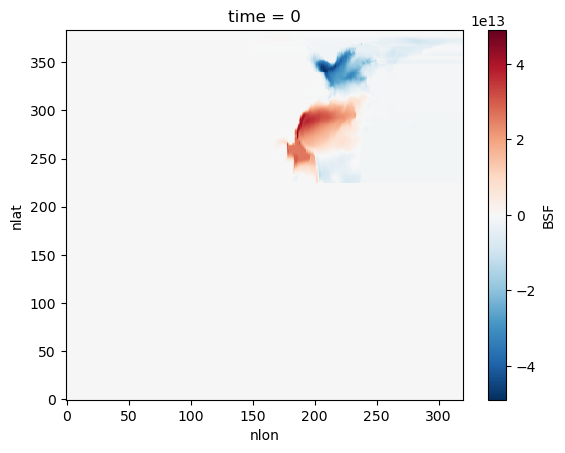

In [145]:
ds_bsf_aa.BSF.isel(time=0).plot()

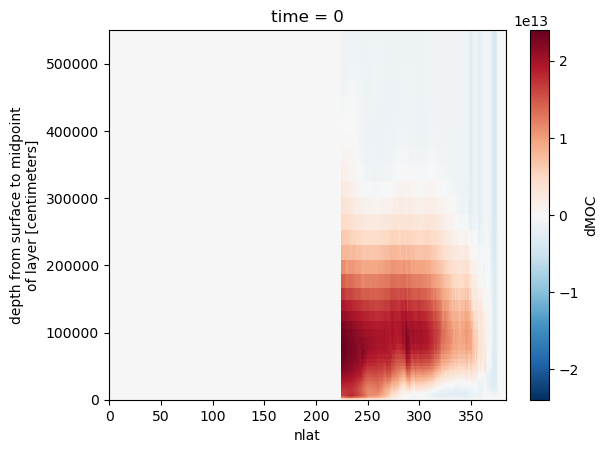

In [146]:
ds_dmoc_aa.dMOC.isel(time=0).plot()

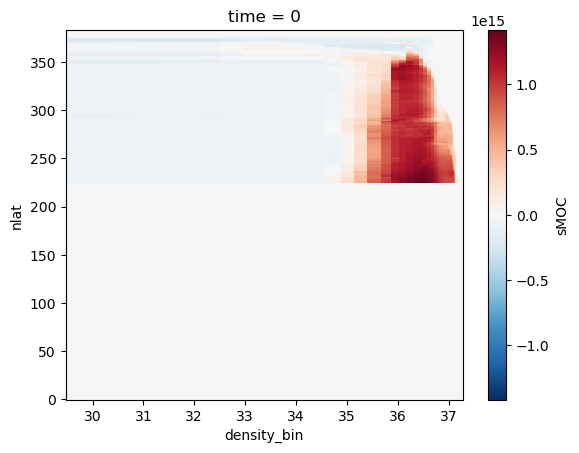

In [147]:
ds_smoc_aa.sMOC.isel(time=0).plot()

### anomalies

#### streamfunctions

In [7]:
smoc_anomaly = ds_smoc_aa.sMOC.isel(time=slice(41,59)).mean('time')-ds_smoc_aa.sMOC.isel(time=slice(0,40)).mean('time')
dmoc_anomaly = ds_dmoc_aa.dMOC.isel(time=slice(41,59)).mean('time')-ds_dmoc_aa.dMOC.isel(time=slice(0,40)).mean('time')
bsf_anomaly = ds_bsf_aa.BSF.isel(time=slice(41,59)).mean('time')-ds_bsf_aa.BSF.isel(time=slice(0,40)).mean('time')

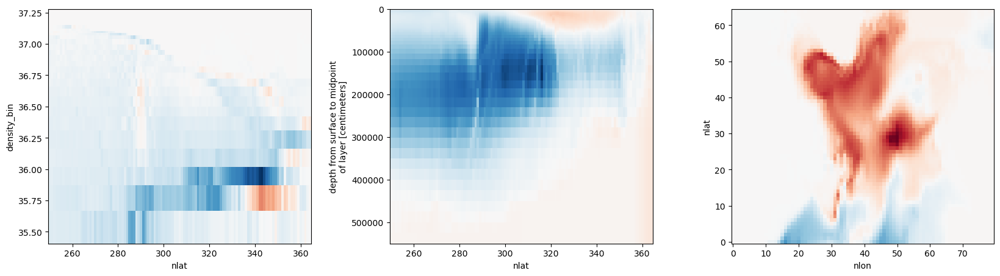

In [8]:
fig, axs = plt.subplots(1, 3, figsize=(20, 5))

fig.subplots_adjust(wspace=0.3)

# Plot the differences in respective subplots
smoc_anomaly.isel(nlat=slice(250, 365), density_bin=slice(15, 40)).transpose().plot(ax=axs[0], add_colorbar=False)

dmoc_anomaly.isel(nlat=slice(250, 365)).plot(ax=axs[1], add_colorbar=False)
axs[1].invert_yaxis()

bsf_anomaly.isel(nlat=slice(300, 365), nlon=slice(180,260)).plot(ax=axs[2], add_colorbar=False)

#### hydrographic variables

In [9]:
temp_anomaly = ds_temp_aa.TEMP.isel(time=slice(41,59)).mean('time')-ds_temp_aa.TEMP.isel(time=slice(0,40)).mean('time')
salt_anomaly = ds_salt_aa.SALT.isel(time=slice(41,59)).mean('time')-ds_salt_aa.SALT.isel(time=slice(0,40)).mean('time')
dens_anomaly = ds_dens_aa.DENS2.isel(time=slice(41,59)).mean('time')-ds_dens_aa.DENS2.isel(time=slice(0,40)).mean('time')

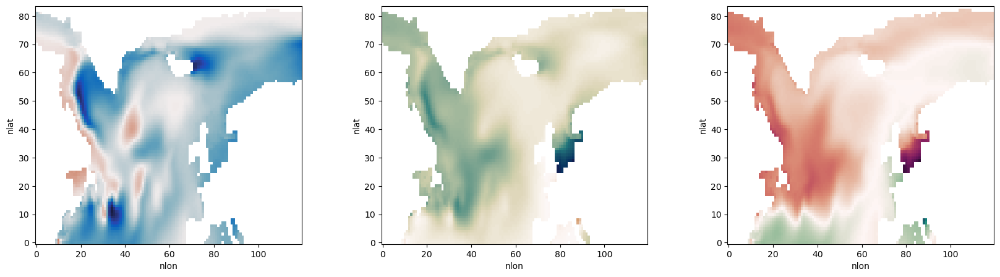

In [16]:
fig, axs = plt.subplots(1, 3, figsize=(20, 5))

fig.subplots_adjust(wspace=0.3)

temp_anomaly.isel(nlat=slice(300, 400), nlon=slice(180,300)).sel(z_t=slice(0, 10000)).mean('z_t').plot(ax=axs[0], add_colorbar=False, cmap = cmo.balance)

salt_anomaly.isel(nlat=slice(300, 400), nlon=slice(180,300)).sel(z_t=slice(0, 10000)).mean('z_t').plot(ax=axs[1], add_colorbar=False, cmap = cmo.tarn_r)

dens_anomaly.isel(nlat=slice(300, 400), nlon=slice(180,300)).sel(z_t=slice(0, 10000)).mean('z_t').plot(ax=axs[2], add_colorbar=False, cmap = cmo.curl_r)

## flip books

#### smoc

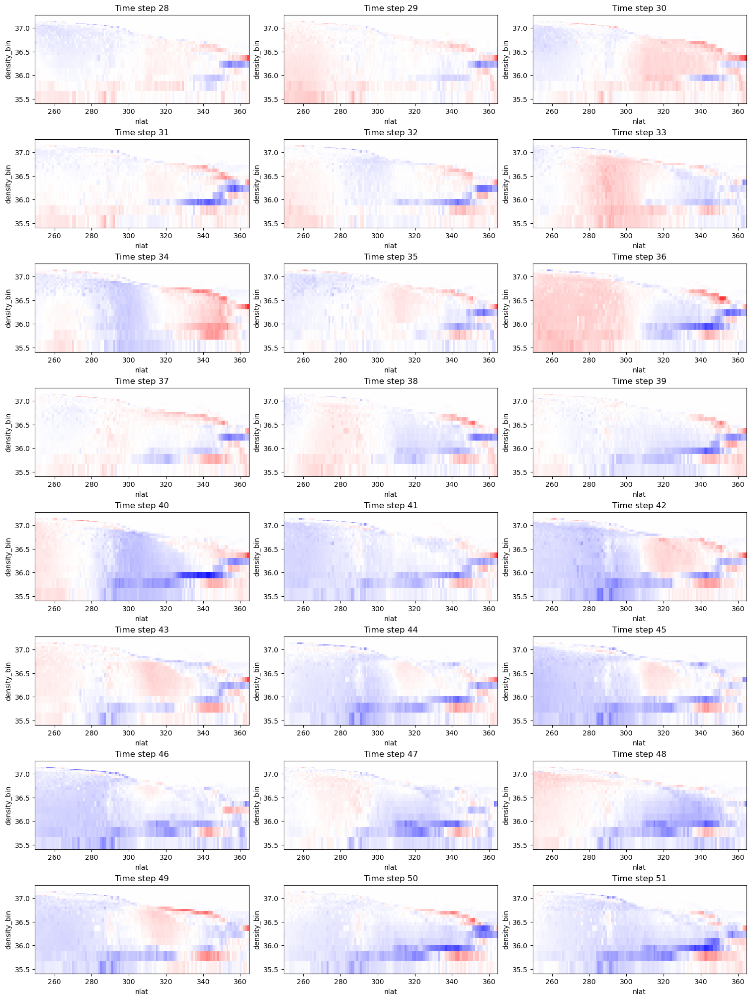

In [8]:
vmin = -5*1e14
vmax = 5*1e14

fig, axs = plt.subplots(8, 3, figsize=(15, 20), constrained_layout=True)

# Flatten the array of axes for easy indexing
axs = axs.flatten()

# Loop through the specified time steps and create subplots
for i, time_step in enumerate(range(28, 52)):
    
    ds = ds_smoc_aa.sMOC - ds_smoc_aa.sMOC.isel(time=slice(0, 40)).mean('time')
    data = ds.isel(time=time_step, nlat=slice(250, 365), density_bin=slice(15, 40)).transpose()
    data.plot(ax=axs[i], 
              add_colorbar=False,
              cmap='bwr',
              vmin=vmin, vmax=vmax
             )
    axs[i].set_title(f'Time step {time_step}')

# Show the plot
plt.show()

#### dmoc

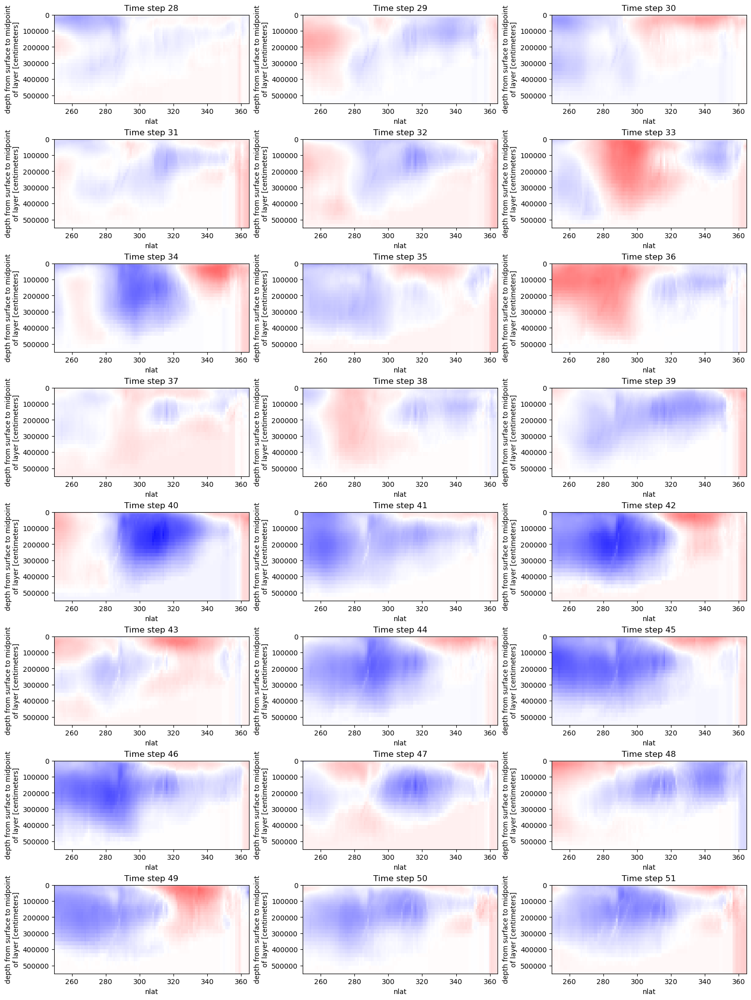

In [9]:
vmin = -3*1e12
vmax = 3*1e12

fig, axs = plt.subplots(8, 3, figsize=(15, 20), constrained_layout=True)

# Flatten the array of axes for easy indexing
axs = axs.flatten()

# Loop through the specified time steps and create subplots
for i, time_step in enumerate(range(28, 52)):
    
    ds = ds_dmoc_aa.dMOC - ds_dmoc_aa.dMOC.isel(time=slice(0, 40)).mean('time')
    data = ds.isel(time=time_step, nlat=slice(250, 365))
    data.plot(ax=axs[i], 
          add_colorbar=False,
          cmap='bwr',
          vmin=vmin, vmax=vmax
         )
    axs[i].invert_yaxis()
    axs[i].set_title(f'Time step {time_step}')

# Show the plot
plt.show()

#### bsf

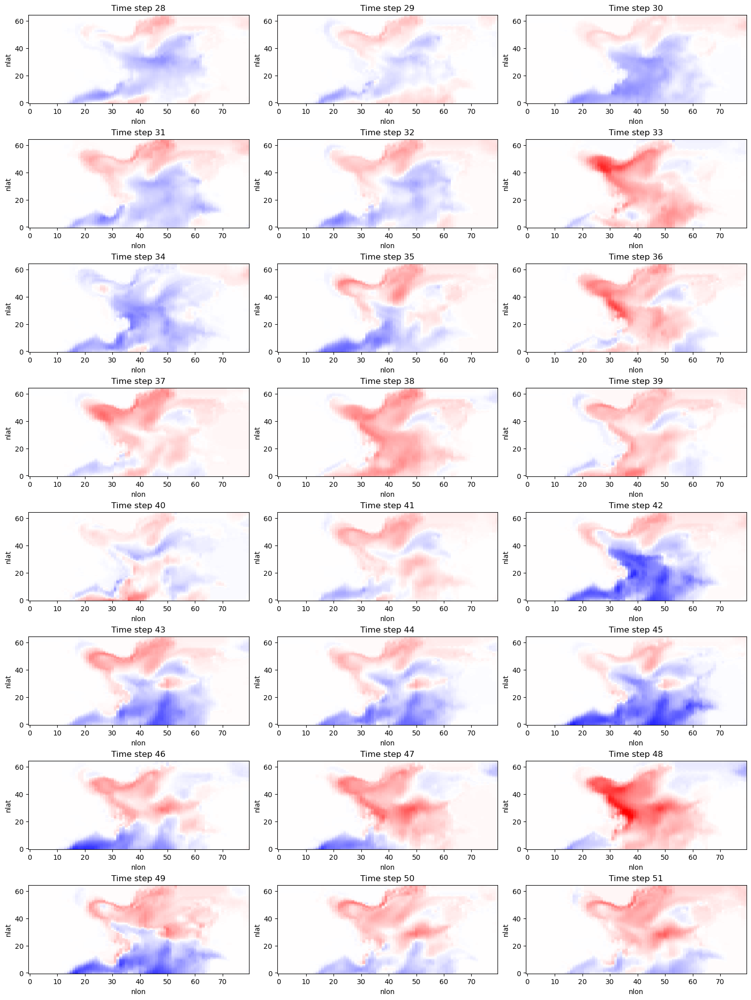

In [10]:
vmin = -7*1e12
vmax = 7*1e12

fig, axs = plt.subplots(8, 3, figsize=(15, 20), constrained_layout=True)

# Flatten the array of axes for easy indexing
axs = axs.flatten()

# Loop through the specified time steps and create subplots
for i, time_step in enumerate(range(28, 52)):
    
    ds = ds_bsf_aa.BSF - ds_bsf_aa.BSF.isel(time=slice(0, 40)).mean('time')
    data = ds.isel(time=time_step, nlat=slice(300, 365), nlon=slice(180,260))
    data.plot(ax=axs[i], 
              add_colorbar=False,
              cmap='bwr',
              vmin=vmin, vmax=vmax
             )
    axs[i].set_title(f'Time step {time_step}')

# Show the plot
plt.show()

### hydrographic variables

In [18]:
datasets = {
    'TEMP': ds_temp_aa.roll(nlon=+100),
    'SALT': ds_salt_aa.roll(nlon=+100),
    'DENS2': ds_dens_aa.roll(nlon=+100),
    'HMXL': ds_hmxl_aa.roll(nlon=+100),
    'SHF': ds_shf_aa.roll(nlon=+100)
}

# Define the replacement value
replacement_value = 0

# Iterate over the list of datasets and replace NaN, inf, and masked values
for ds in datasets.values():
    ds['TLAT'] = xr.where(
        np.logical_or(np.isnan(ds['TLAT']), np.isinf(ds['TLAT']) | np.ma.getmask(ds['TLAT'])),
        replacement_value,
        ds['TLAT']
    )
    ds['TLONG'] = xr.where(
        np.logical_or(np.isnan(ds['TLONG']), np.isinf(ds['TLONG']) | np.ma.getmask(ds['TLONG'])),
        replacement_value,
        ds['TLONG']
    )

In [19]:
variables = ['TEMP', 'SALT', 'DENS2', 'HMXL', 'SHF']
labels = [r'Temperature Anomaly over first 100 metres (Period 1 - Specific Decade)  $\Delta$T [$^{\circ} C$]', 
          r'Haline Anomaly first over first 100 metres (Period 1 - Specific Decade)  $\Delta$S [$\frac{g}{kg}$]', 
          r'Potential Density Anomaly over first 100 metres (Period 1 - Specific Decade) $\Delta\sigma_2$ [$\frac{kg}{m^3} -1000$]',
          r'Mixed Layer Depth Anomaly (Period 1 - Period 2) $\Delta h$ [$m$]',
          r'Surface Heat Flux Anomaly (Period 1 - Period 2) $\Delta\Phi$ [$\frac{W}{m^2}$]']
cmaps = [cmo.balance, cmo.tarn_r, cmo.curl_r, 'seismic', cmo.delta]
vmins = [-1, -0.4, -0.3, -200, -75]



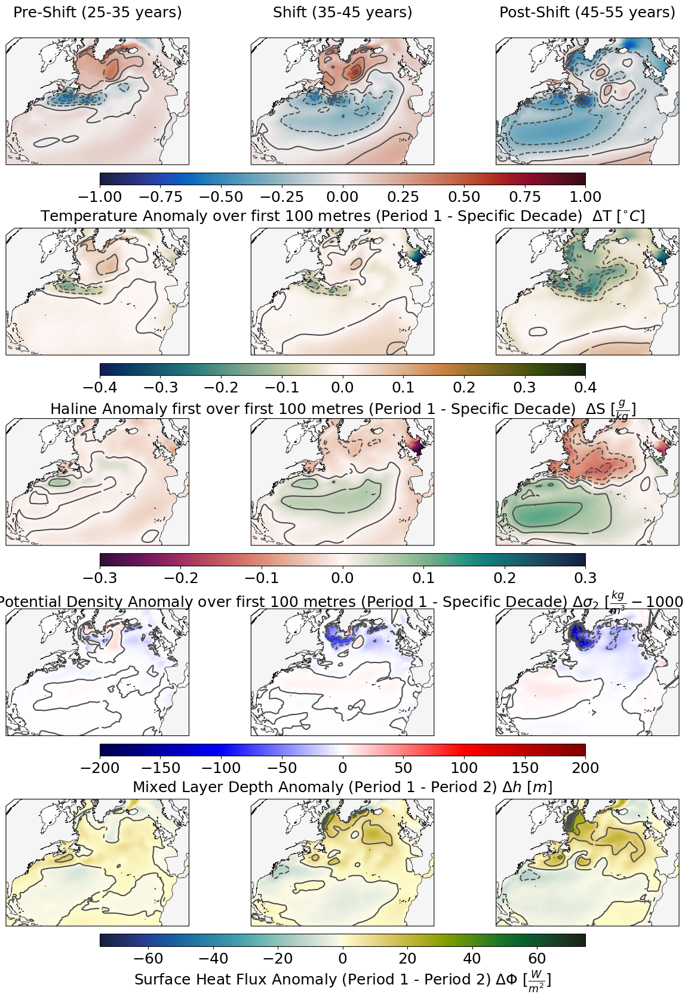

In [22]:
fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(15, 20),
                         subplot_kw={'projection': ccrs.Orthographic(central_latitude=20, central_longitude=-35)})
#fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(15, 13), 
#                         subplot_kw={'projection': ccrs.Orthographic(central_latitude=20, central_longitude=-35)})

plt.rc('font', size=18)
years_ranges = [(25, 35), (35, 45), (45, 55)]
column_names = ['Pre-Shift (25-35 years)', 'Shift (35-45 years)', 'Post-Shift (45-55 years)']

for row, var in enumerate(variables):
    if var in ['HMX', 'SHF']:
        ds_var_annual = datasets[var]
    else:
        ds_var_annual = datasets[var].sel(z_t=slice(500, 10500)).mean('z_t')
    
    ds = ds_var_annual - ds_var_annual.isel(time=slice(0, 40)).mean('time')
    vmin = vmins[row]
    vmax = -vmin
    for col, (start, end) in enumerate(years_ranges):
        ax = axes[row, col]
        pc = ds.isel(time=slice(start, end)).mean('time')[var].plot.pcolormesh(
            ax=ax, 
            transform=ccrs.PlateCarree(),
            x='TLONG', 
            y='TLAT',
            cmap=cmaps[row],
            vmin=vmin, vmax=vmax,
            add_colorbar=False
        ) 
        ax.set_extent([-80, -5, 20, 69], crs=ccrs.PlateCarree())
        ax.add_feature(nature_coast)
        #cs = ax.contour(
        #    ds.TLONG, ds.TLAT, ds_var_annual.isel(time=slice(0, 40)).mean('time')[var].where(mask == 1), 
        #    linewidths=0.5, colors='gray', transform=ccrs.PlateCarree()
        #)
        
        cs = ax.contour(
            ds.TLONG.where(mask==1), ds.TLAT.where(mask==1), ds.isel(time=slice(start, end)).mean('time')[var], 
            levels = np.linspace(vmin, vmax, 15),
            linewidths=1.5, colors='#4d4d4d', transform=ccrs.PlateCarree()
        )
        
        #ax.clabel(cs, fmt='%1.0f', inline=True, fontsize=12)
    cbar = fig.colorbar(pc, ax=axes[row, :], orientation='horizontal', label=labels[row], aspect=40, pad=0.05, shrink=0.7)
    
for col, name in enumerate(column_names):
    axes[0, col].set_title(name, fontsize=18, pad=25)
#fig.suptitle(r'2$\sigma$ Decreased Circulation Shifts -- aa hist', fontsize=20, fontweight='bold', x=0.5, y=0.95)  # bottom-left (0, 0) and top-right (1, 1)

#plt.show()
plt.savefig('Figure_aa_decrease_flipbooks.png', bbox_inches='tight', dpi=300, transparent=True)      

## time series

In [6]:
grid_name = 'POP_gx1v7'
region_defs = {
    'SubpolarAtlantic': [
        {'match': {'REGION_MASK': [6]}, 'bounds': {'TLAT': [50.0, 65.0], 'TLONG': [200.0, 360.0]}}
    ],
    'LabradorSea': [
        {'match': {'REGION_MASK': [8]}, 'bounds': {'TLAT': [50.0, 65.0], 'TLONG': [260.0, 360.0]}}]}
SPNA_mask = pop_tools.region_mask_3d(grid_name, region_defs=region_defs, mask_name='North Atlantic')
SPNA_mask = SPNA_mask.sum('region')

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


In [20]:
depth_slice = slice(None, 50000)

ds_masked_temp = ds_temp_aa.where(SPNA_mask == 1).sel(z_t=depth_slice)
ds_masked_salt = ds_salt_aa.where(SPNA_mask == 1).sel(z_t=depth_slice)

weights = ds_masked_temp.z_t.sel(z_t=depth_slice) * ds_masked_temp.TAREA
weights = weights.fillna(0)

#temp_weighted_mean = (ds_temp_aa.TEMP.where(SPNA_mask == 1).sel(z_t=depth_slice) * weights).sum(dim=['nlat', 'nlon', 'z_t']) / weights.sum(dim=['nlat', 'nlon', 'z_t'])
#salt_weighted_mean = (ds_salt_aa.SALT.where(SPNA_mask == 1).sel(z_t=depth_slice) * weights).sum(dim=['nlat', 'nlon', 'z_t']) / weights.sum(dim=['nlat', 'nlon', 'z_t'])

temp_weighted_mean = ds_masked_temp.TEMP.weighted(weights).mean(dim=['nlat', 'nlon', 'z_t'])
salt_weighted_mean = ds_masked_salt.SALT.weighted(weights).mean(dim=['nlat', 'nlon', 'z_t'])


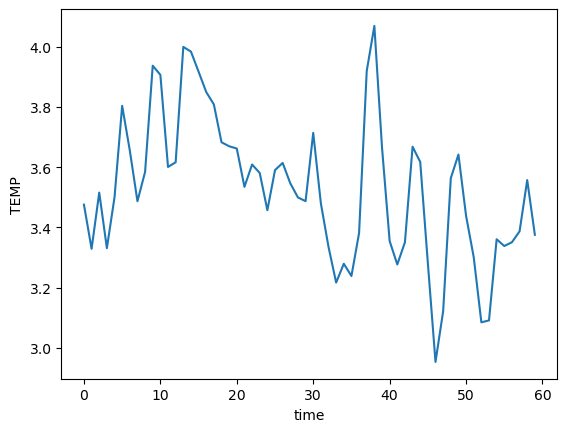

In [21]:
temp_weighted_mean.plot()
#salt_weighted_mean.plot()

### Plot heat and freshwater content - NOT WEIGHTED

In [188]:
grid_name = 'POP_gx1v7'
region_defs = {
    'SubpolarAtlantic': [
        {'match': {'REGION_MASK': [6]}, 'bounds': {'TLAT': [50.0, 65.0], 'TLONG': [200.0, 360.0]}}
    ],
    'LabradorSea': [
        {'match': {'REGION_MASK': [8]}, 'bounds': {'TLAT': [50.0, 65.0], 'TLONG': [260.0, 360.0]}}
    ]
}

# Create mask for selected regions
mask = pop_tools.region_mask_3d(grid_name, region_defs=region_defs, mask_name='North Atlantic')
mask = mask.sum('region')

ds_temp_aa = ds_temp_aa.where(mask == 1)
ds_salt_aa = ds_salt_aa.where(mask == 1)

In [189]:
# Define physical constants
rho_sw = 1026  # density of seawater in kg/m^3
cp_sw = 3990  # specific heat of seawater in J/(kg·K)

# Convert units to meters and square meters
ds_salt_aa['dz'] = ds_temp_aa.dz * 1e-2
ds_temp_aa['UAREA'] = ds_temp_aa.UAREA * 1e-4

# Define reference salinity
S_ref = 35  # PSU

# Convert units to meters and square meters
ds_salt_aa['dz'] = ds_salt_aa.dz * 1e-2
ds_salt_aa['UAREA'] = ds_salt_aa.UAREA * 1e-4

In [190]:
# Compute heat content
heat_content = rho_sw * cp_sw * (ds_temp_aa.dz * ds_temp_aa.UAREA * ds_temp_aa.TEMP).sum(dim=['nlat', 'nlon', 'z_t'])

# Freshwater content computation (add this line)
freshwater_content = ((S_ref - ds_salt_aa.SALT) / S_ref * ds_salt_aa.dz * ds_salt_aa.UAREA).sum(dim=['nlat', 'nlon', 'z_t'])

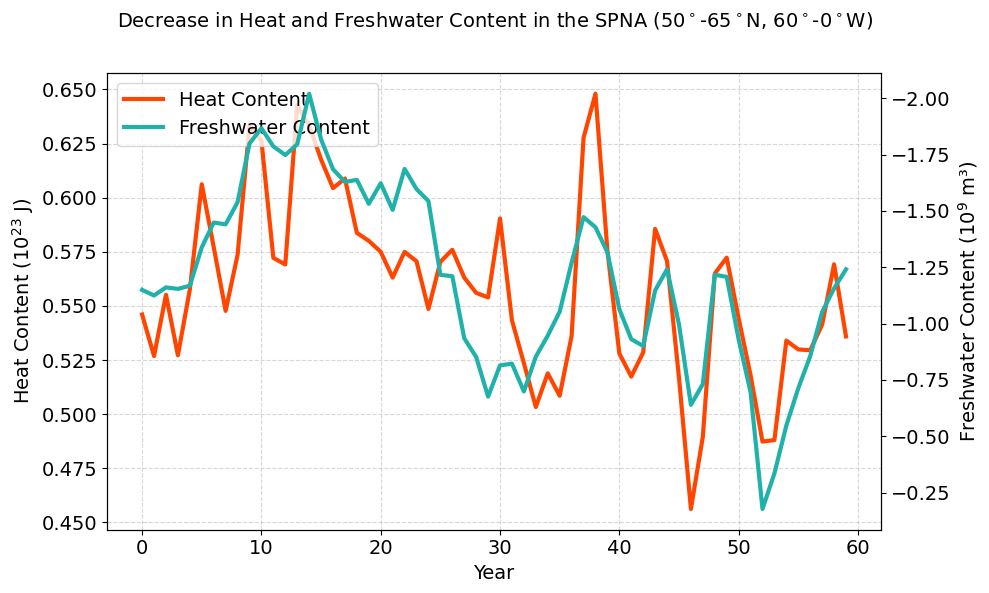

In [191]:
# Define a consistent font size
fontsize = 14

# Define the figure and axis
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot heat content time series
ax1.plot(heat_content.time, heat_content / 1e23, color='orangered', label='Heat Content', linewidth = 3)
ax1.set_xlabel('Year', fontsize=fontsize)
ax1.set_ylabel('Heat Content ($10^{23}$ J)', fontsize=fontsize)
ax1.tick_params(axis='both', which='major', labelsize=fontsize)

# Twin axis for freshwater content and flip y-axis
ax2 = ax1.twinx()
ax2.invert_yaxis()
ax2.plot(freshwater_content.time, freshwater_content / 1e9, color='lightseagreen', label='Freshwater Content', linewidth = 3)
ax2.set_ylabel('Freshwater Content ($10^9$ m³)', fontsize=fontsize)
ax2.tick_params(axis='both', which='major', labelsize=fontsize)

# Combine legends
lines_1, labels_1 = ax1.get_legend_handles_labels()
lines_2, labels_2 = ax2.get_legend_handles_labels()
ax1.legend(lines_1 + lines_2, labels_1 + labels_2, loc='upper left', fontsize=fontsize)

# Title
fig.suptitle(r'Decrease in Heat and Freshwater Content in the SPNA (50$^\circ$-65$^\circ$N, 60$^\circ$-0$^\circ$W)', fontsize=fontsize)

# Grid and Layout
ax1.grid(True, linestyle='--', alpha=0.5)
fig.tight_layout(rect=[0, 0, 1, 0.96])

# Save the figure
plt.savefig('Figure_aa_decrease_content.png', bbox_inches='tight', dpi=300)

# Show the plot
#plt.show()

# After 1980

In [23]:
ds_temp_ghg = xr.open_dataset('/Data/skd/scratch/innag3580/comp/composites/Below_combined_TEMP_3.0_40_20.nc')
ds_salt_ghg = xr.open_dataset('/Data/skd/scratch/innag3580/comp/composites/Below_combined_SALT_3.0_40_20.nc')
ds_hmxl_ghg = xr.open_dataset('/Data/skd/scratch/innag3580/comp/composites/Below_combined_HMXL_3.0_40_20.nc')
ds_shf_ghg  = xr.open_dataset('/Data/skd/scratch/innag3580/comp/composites/Below_combined_SHF_3.0_40_20.nc')

In [24]:
ds_hmxl_ghg['HMXL']=ds_hmxl_ghg.HMXL*1e-2

In [25]:
CT = gsw.conversions.CT_from_pt(ds_salt_ghg['SALT'], ds_temp_ghg['TEMP'])
sigma2 = gsw.density.sigma2(ds_salt_ghg['SALT'], CT)
sigma2 = xr.DataArray(sigma2, name='DENS2', dims=ds_temp_ghg['TEMP'].dims, coords=ds_temp_ghg['TEMP'].coords)

ds_dens_ghg = ds_temp_ghg
ds_dens_ghg = ds_dens_ghg.drop_vars('TEMP')
ds_dens_ghg['DENS2'] = sigma2

## stream functions

In [26]:
ds_smoc_ghg = xr.open_dataset('/Data/skd/scratch/innag3580/comp/composites/Below_combined_smoc_3.0_40_20_ghg_hist.nc')
ds_dmoc_ghg = xr.open_dataset('/Data/skd/scratch/innag3580/comp/composites/Below_combined_dmoc_3.0_40_20_ghg_hist.nc')
ds_bsf_ghg = xr.open_dataset('/Data/skd/scratch/innag3580/comp/composites/Below_combined_bsf_3.0_40_20_ghg_hist.nc')

In [27]:
# get smoc in shape
numbers = np.array([29.70, 31.50, 33.15, 34.75, 35.80, 36.38, 36.70, 36.89, 37.06, 37.13, 37.30])
intervals = np.diff(numbers) / 4
result = np.concatenate([np.arange(numbers[i], numbers[i+1], intervals[i]) for i in range(len(intervals))])
density_bins = np.append(result, numbers[-1])

ds_smoc_ghg = ds_smoc_ghg.rename({'__xarray_dataarray_variable__': 'sMOC'})

ds_keep = ds_dens_ghg.isel(nlon=0).squeeze()
ds_smoc_ghg = ds_smoc_ghg.assign_coords(TLAT=ds_keep.TLAT)
replacement_value = 0
ds_smoc_ghg['TLAT'] = xr.where(
    np.logical_or(np.isnan(ds_smoc_ghg['TLAT']), np.isinf(ds_smoc_ghg['TLAT']) | np.ma.getmask(ds_smoc_ghg['TLAT'])),
    replacement_value,
    ds_smoc_ghg['TLAT']
)

# get dmoc in shape
ds_dmoc_ghg = ds_dmoc_ghg.rename({'__xarray_dataarray_variable__': 'dMOC'})
ds_dmoc_ghg = ds_dmoc_ghg.assign_coords(TLAT=ds_smoc_ghg.TLAT)

# get bsf in shape
ds_bsf_ghg = ds_bsf_ghg.rename({'__xarray_dataarray_variable__': 'BSF'})
ds_bsf_ghg = ds_bsf_ghg.assign_coords(TLAT=ds_bsf_ghg.TLAT)

### anomalies

In [23]:
smoc_anomaly = ds_smoc_ghg.sMOC.isel(time=slice(41,59)).mean('time')-ds_smoc_ghg.sMOC.isel(time=slice(0,40)).mean('time')
dmoc_anomaly = ds_dmoc_ghg.dMOC.isel(time=slice(41,59)).mean('time')-ds_dmoc_ghg.dMOC.isel(time=slice(0,40)).mean('time')
bsf_anomaly = ds_bsf_ghg.BSF.isel(time=slice(41,59)).mean('time')-ds_bsf_ghg.BSF.isel(time=slice(0,40)).mean('time')

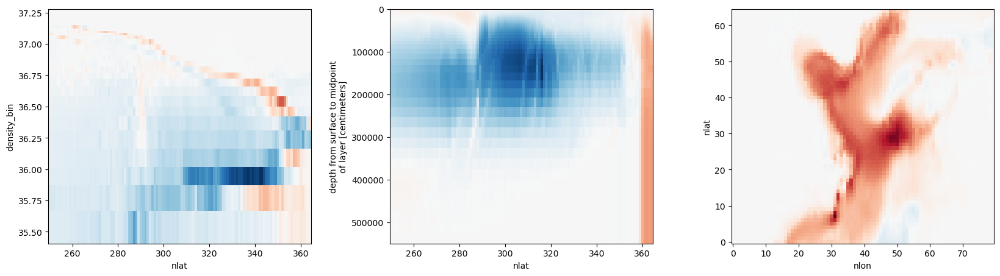

In [24]:
fig, axs = plt.subplots(1, 3, figsize=(20, 5))

fig.subplots_adjust(wspace=0.3)

# Plot the differences in respective subplots
smoc_anomaly.isel(nlat=slice(250, 365), density_bin=slice(15, 40)).transpose().plot(ax=axs[0], add_colorbar=False)

dmoc_anomaly.isel(nlat=slice(250, 365)).plot(ax=axs[1], add_colorbar=False)
axs[1].invert_yaxis()

bsf_anomaly.isel(nlat=slice(300, 365), nlon=slice(180,260)).plot(ax=axs[2], add_colorbar=False)

#### hydrographic variables

In [12]:
temp_anomaly = ds_temp_ghg.TEMP.isel(time=slice(41,59)).mean('time')-ds_temp_ghg.TEMP.isel(time=slice(0,40)).mean('time')
salt_anomaly = ds_salt_ghg.SALT.isel(time=slice(41,59)).mean('time')-ds_salt_ghg.SALT.isel(time=slice(0,40)).mean('time')
dens_anomaly = ds_dens_ghg.DENS2.isel(time=slice(41,59)).mean('time')-ds_dens_ghg.DENS2.isel(time=slice(0,40)).mean('time')

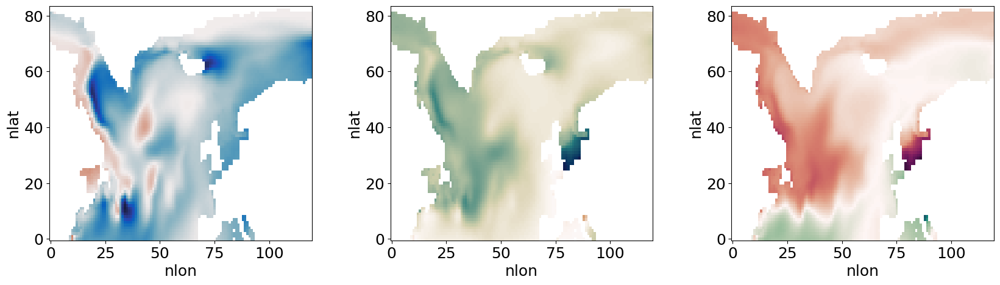

In [13]:
fig, axs = plt.subplots(1, 3, figsize=(20, 5))

fig.subplots_adjust(wspace=0.3)

temp_anomaly.isel(nlat=slice(300, 400), nlon=slice(180,300)).sel(z_t=slice(0, 10000)).mean('z_t').plot(ax=axs[0], add_colorbar=False, cmap = cmo.balance)

salt_anomaly.isel(nlat=slice(300, 400), nlon=slice(180,300)).sel(z_t=slice(0, 10000)).mean('z_t').plot(ax=axs[1], add_colorbar=False, cmap = cmo.tarn_r)

dens_anomaly.isel(nlat=slice(300, 400), nlon=slice(180,300)).sel(z_t=slice(0, 10000)).mean('z_t').plot(ax=axs[2], add_colorbar=False, cmap = cmo.curl_r)

## flip books

### smoc flip books

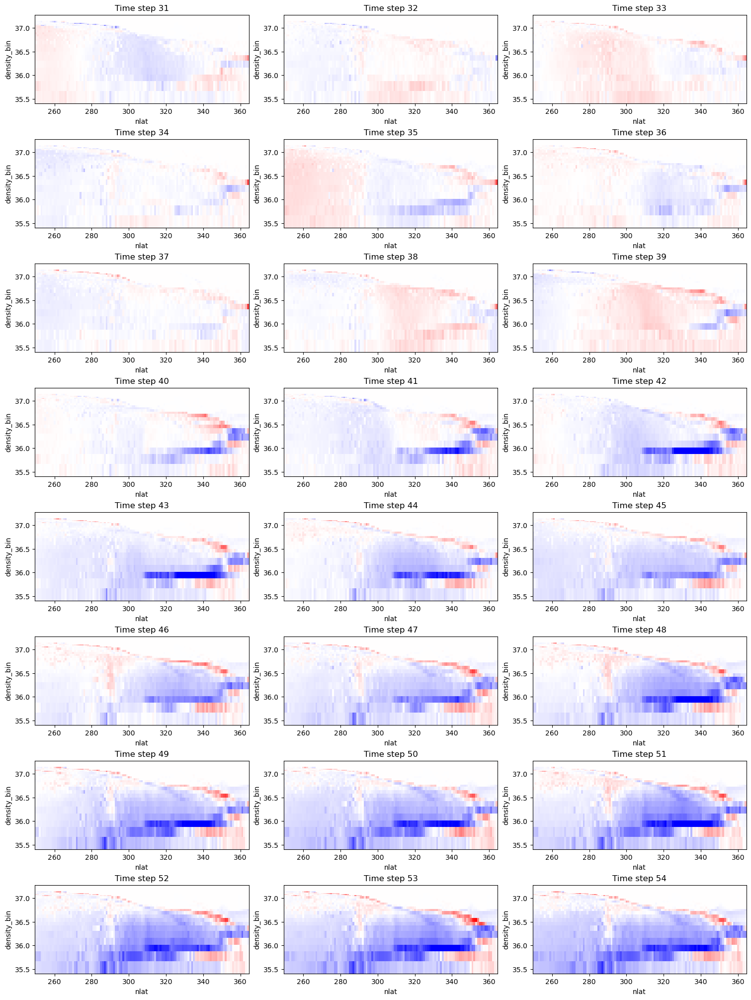

In [46]:
vmin = -5*1e14
vmax = 5*1e14

fig, axs = plt.subplots(8, 3, figsize=(15, 20), constrained_layout=True)

# Flatten the array of axes for easy indexing
axs = axs.flatten()

# Loop through the specified time steps and create subplots
for i, time_step in enumerate(range(31, 55)):
    
    ds = ds_smoc_ghg.sMOC - ds_smoc_ghg.sMOC.isel(time=slice(0, 40)).mean('time')
    data = ds.isel(time=time_step, nlat=slice(250, 365), density_bin=slice(15, 40)).transpose()
    data.plot(ax=axs[i], 
              add_colorbar=False,
              cmap='bwr',
              vmin=vmin, vmax=vmax
             )
    axs[i].set_title(f'Time step {time_step}')

# Show the plot
plt.show()

### dmoc flip books

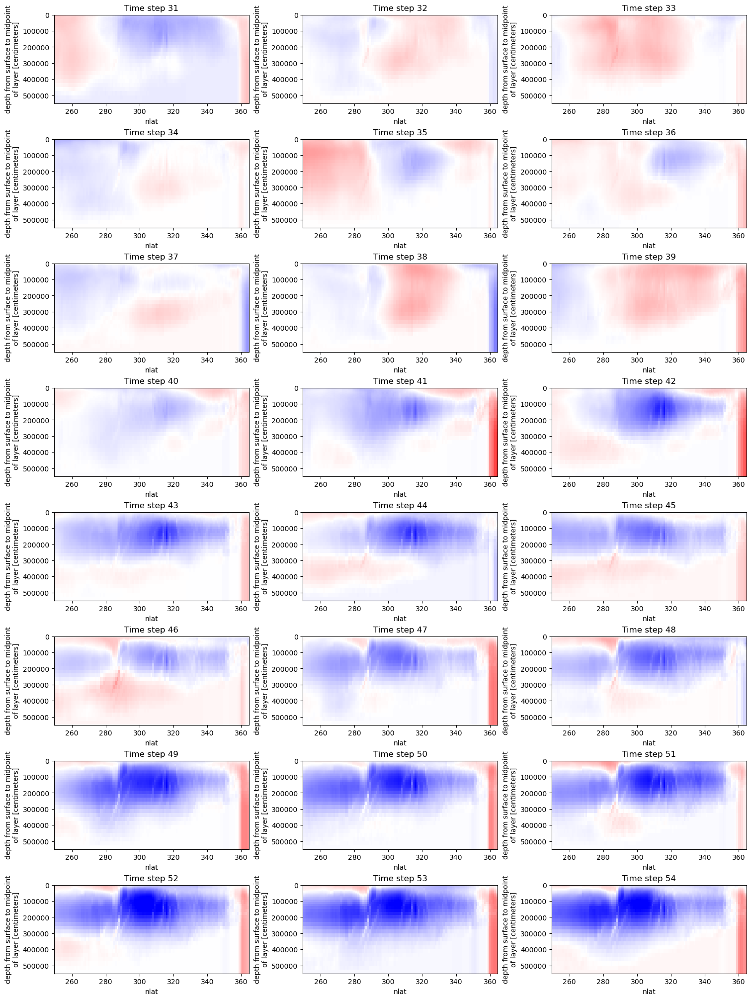

In [47]:
vmin = -3*1e12
vmax = 3*1e12

fig, axs = plt.subplots(8, 3, figsize=(15, 20), constrained_layout=True)

# Flatten the array of axes for easy indexing
axs = axs.flatten()

# Loop through the specified time steps and create subplots
for i, time_step in enumerate(range(31, 55)):
    
    ds = ds_dmoc_ghg.dMOC - ds_dmoc_ghg.dMOC.isel(time=slice(0, 40)).mean('time')
    data = ds.isel(time=time_step, nlat=slice(250, 365))
    data.plot(ax=axs[i], 
          add_colorbar=False,
          cmap='bwr',
          vmin=vmin, vmax=vmax
         )
    axs[i].invert_yaxis()
    axs[i].set_title(f'Time step {time_step}')

# Show the plot
plt.show()

### bsf flip books

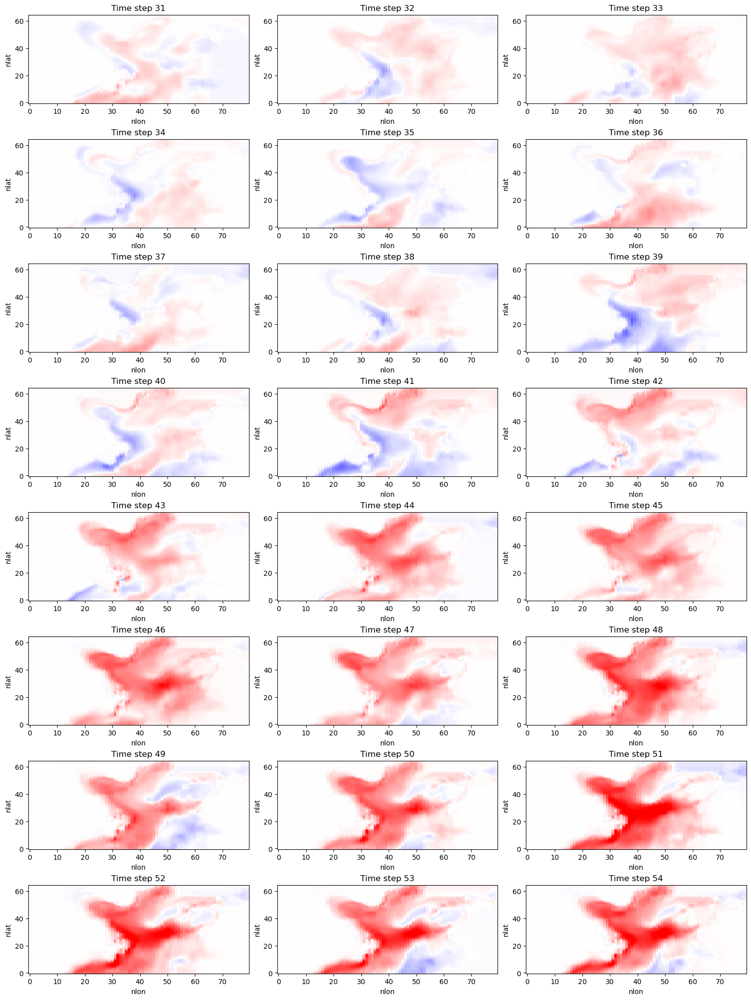

In [48]:
vmin = -7*1e12
vmax = 7*1e12

fig, axs = plt.subplots(8, 3, figsize=(15, 20), constrained_layout=True)

# Flatten the array of axes for easy indexing
axs = axs.flatten()

# Loop through the specified time steps and create subplots
for i, time_step in enumerate(range(31, 55)):
    
    ds = ds_bsf_ghg.BSF - ds_bsf_ghg.BSF.isel(time=slice(0, 40)).mean('time')
    data = ds.isel(time=time_step, nlat=slice(300, 365), nlon=slice(180,260))
    data.plot(ax=axs[i], 
              add_colorbar=False,
              cmap='bwr',
              vmin=vmin, vmax=vmax
             )
    axs[i].set_title(f'Time step {time_step}')

# Show the plot
plt.show()

### hydropgraphic flip books

In [28]:
datasets = {
    'TEMP': ds_temp_ghg.roll(nlon=+100),
    'SALT': ds_salt_ghg.roll(nlon=+100),
    'DENS2': ds_dens_ghg.roll(nlon=+100),
    'HMXL': ds_hmxl_ghg.roll(nlon=+100),
    'SHF': ds_shf_ghg.roll(nlon=+100)
}

# Define the replacement value
replacement_value = 0

# Iterate over the list of datasets and replace NaN, inf, and masked values
for ds in datasets.values():
    ds['TLAT'] = xr.where(
        np.logical_or(np.isnan(ds['TLAT']), np.isinf(ds['TLAT']) | np.ma.getmask(ds['TLAT'])),
        replacement_value,
        ds['TLAT']
    )
    ds['TLONG'] = xr.where(
        np.logical_or(np.isnan(ds['TLONG']), np.isinf(ds['TLONG']) | np.ma.getmask(ds['TLONG'])),
        replacement_value,
        ds['TLONG']
    )

In [29]:
variables = ['TEMP', 'SALT', 'DENS2']#, 'HMXL', 'SHF']
labels = [r'Temperature Anomaly over first 100 metres (Period 1 - Specific Decade)  $\Delta$T [$^{\circ} C$]', 
          r'Haline Anomaly first over first 100 metres (Period 1 - Specific Decade)  $\Delta$S [$\frac{g}{kg}$]', 
          r'Potential Density Anomaly over first 100 metres (Period 1 - Specific Decade) $\Delta\sigma_2$ [$\frac{kg}{m^3} -1000$]',
          r'Mixed Layer Depth Anomaly (Period 1 - Period 2) $\Delta h$ [$m$]',
          r'Surface Heat Flux Anomaly (Period 1 - Period 2) $\Delta\Phi$ [$\frac{W}{m^2}$]']
cmaps = [cmo.balance, cmo.tarn_r, cmo.curl_r, 'seismic', cmo.delta]
vmins = [-1, -0.4, -0.3, -200, -75]

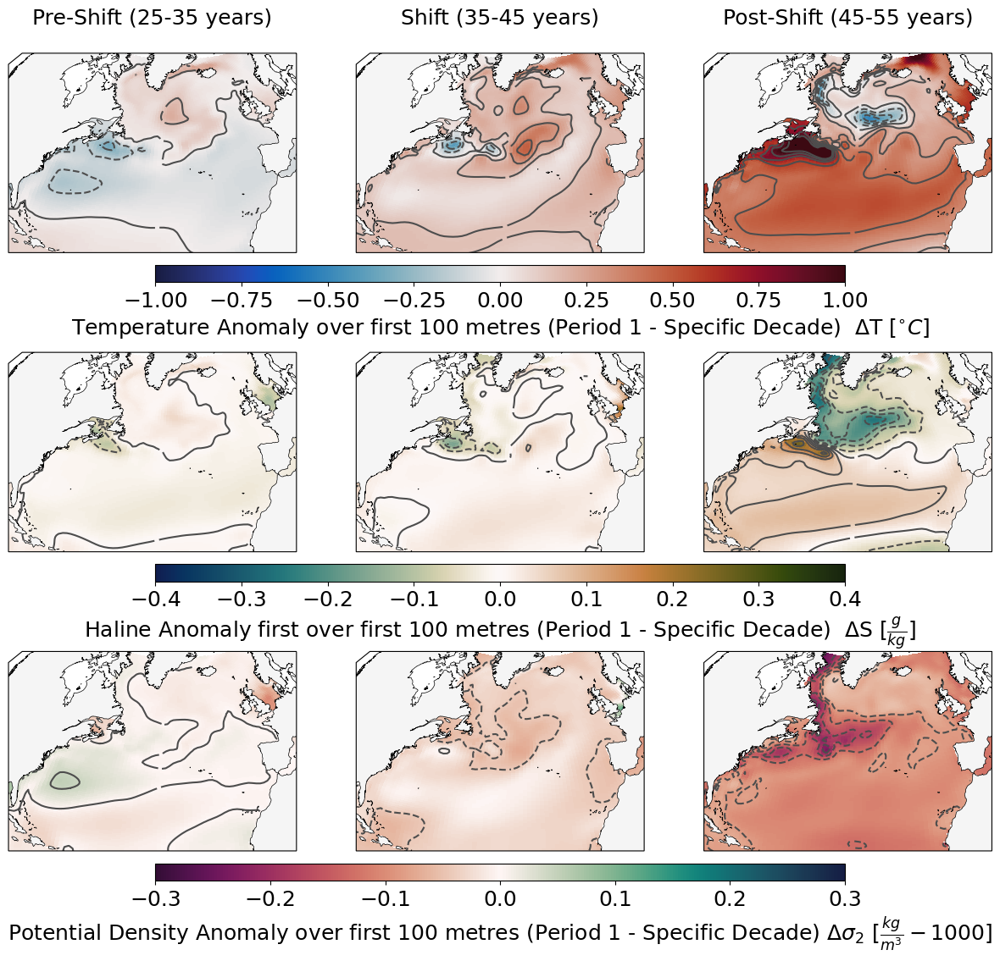

In [30]:
#fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(15, 20),  # Adjusted height for 5 rows
#                         subplot_kw={'projection': ccrs.Orthographic(central_latitude=20, central_longitude=-35)})
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(15, 13),  # Adjusted height for 5 rows
                         subplot_kw={'projection': ccrs.Orthographic(central_latitude=20, central_longitude=-35)})


plt.rc('font', size=18)
years_ranges = [(25, 35), (35, 45), (45, 55)]
column_names = ['Pre-Shift (25-35 years)', 'Shift (35-45 years)', 'Post-Shift (45-55 years)']


for row, var in enumerate(variables):
    if var in ['HMX', 'SHF']:
        ds_var_annual = datasets[var]
    else:
        ds_var_annual = datasets[var].sel(z_t=slice(500, 10500)).mean('z_t')
    
    ds = ds_var_annual - ds_var_annual.isel(time=slice(0, 40)).mean('time')
    vmin = vmins[row]
    vmax = -vmin
    for col, (start, end) in enumerate(years_ranges):
        ax = axes[row, col]
        pc = ds.isel(time=slice(start, end)).mean('time')[var].plot.pcolormesh(
            ax=ax, 
            transform=ccrs.PlateCarree(),
            x='TLONG', 
            y='TLAT',
            cmap=cmaps[row],
            vmin=vmin, vmax=vmax,
            add_colorbar=False
        ) 
        ax.set_extent([-80, -5, 20, 69], crs=ccrs.PlateCarree())
        ax.add_feature(nature_coast)
        #cs = ax.contour(
        #    ds.TLONG, ds.TLAT, ds_var_annual.isel(time=slice(0, 40)).mean('time')[var].where(mask == 1), 
        #    linewidths=0.5, colors='gray', transform=ccrs.PlateCarree()
        #)
        
        cs = ax.contour(
            ds.TLONG.where(mask==1), ds.TLAT.where(mask==1), ds.isel(time=slice(start, end)).mean('time')[var], 
            levels = np.linspace(vmin, vmax, 15),
            linewidths=1.5, colors='#4d4d4d', transform=ccrs.PlateCarree()
        )
        
        #ax.clabel(cs, fmt='%1.0f', inline=True, fontsize=12)
    cbar = fig.colorbar(pc, ax=axes[row, :], orientation='horizontal', label=labels[row], aspect=40, pad=0.05, shrink=0.7)
    
for col, name in enumerate(column_names):
    axes[0, col].set_title(name, fontsize=18, pad=25)
#fig.suptitle(r'3$\sigma$ Decreased Circulation Shifts -- ghg hist', fontsize=20, fontweight='bold', x=0.5, y=0.95)  # bottom-left (0, 0) and top-right (1, 1)

plt.show()
#plt.savefig('Figure_decrease_flipbooks.png', bbox_inches='tight', dpi=300)      

## time series

### heat and freshwater content - WEIGTHING MISSING

In [2]:
ds_temp_ghg = xr.open_dataset('/Data/skd/scratch/innag3580/comp/composites/Below_combined_TEMP_3.0_40_20.nc').roll(nlon=+100)
ds_salt_ghg = xr.open_dataset('/Data/skd/scratch/innag3580/comp/composites/Below_combined_SALT_3.0_40_20.nc').roll(nlon=+100)

In [3]:
grid_name = 'POP_gx1v7'
region_defs = {
    'SubpolarAtlantic': [
        {'match': {'REGION_MASK': [6]}, 'bounds': {'TLAT': [50.0, 65.0], 'TLONG': [200.0, 360.0]}}
    ],
    'LabradorSea': [
        {'match': {'REGION_MASK': [8]}, 'bounds': {'TLAT': [50.0, 65.0], 'TLONG': [260.0, 360.0]}}
    ]
}

# Create mask for selected regions
mask = pop_tools.region_mask_3d(grid_name, region_defs=region_defs, mask_name='North Atlantic')
mask = mask.sum('region')

ds_temp_ghg = ds_temp_ghg.where(mask == 1)
ds_salt_ghg = ds_salt_ghg.where(mask == 1)

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


In [4]:
# Define physical constants
rho_sw = 1026  # density of seawater in kg/m^3
cp_sw = 3990  # specific heat of seawater in J/(kg·K)

# Convert units to meters and square meters
ds_salt_ghg['dz'] = ds_temp_ghg.dz * 1e-2
ds_temp_ghg['UAREA'] = ds_temp_ghg.UAREA * 1e-4

# Define reference salinity
S_ref = 35  # PSU

# Convert units to meters and square meters
ds_salt_ghg['dz'] = ds_salt_ghg.dz * 1e-2
ds_salt_ghg['UAREA'] = ds_salt_ghg.UAREA * 1e-4

In [5]:
# Compute heat content
heat_content = rho_sw * cp_sw * (ds_temp_ghg.dz * ds_temp_ghg.UAREA * ds_temp_ghg.TEMP).sum(dim=['nlat', 'nlon', 'z_t'])

# Freshwater content computation (add this line)
freshwater_content = ((S_ref - ds_salt_ghg.SALT) / S_ref * ds_salt_ghg.dz * ds_salt_ghg.UAREA).sum(dim=['nlat', 'nlon', 'z_t'])

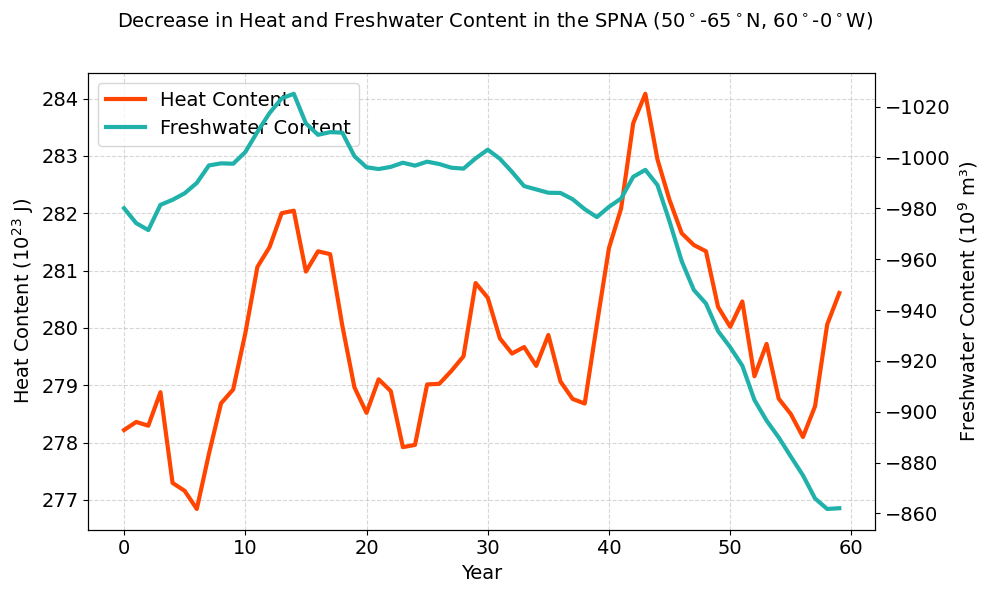

In [6]:
# Define a consistent font size
fontsize = 14

# Define the figure and axis
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot heat content time series
ax1.plot(heat_content.time, heat_content / 1e23, color='orangered', label='Heat Content', linewidth = 3)
ax1.set_xlabel('Year', fontsize=fontsize)
ax1.set_ylabel('Heat Content ($10^{23}$ J)', fontsize=fontsize)
ax1.tick_params(axis='both', which='major', labelsize=fontsize)

# Twin axis for freshwater content and flip y-axis
ax2 = ax1.twinx()
ax2.invert_yaxis()
ax2.plot(freshwater_content.time, freshwater_content / 1e9, color='lightseagreen', label='Freshwater Content', linewidth = 3)
ax2.set_ylabel('Freshwater Content ($10^9$ m³)', fontsize=fontsize)
ax2.tick_params(axis='both', which='major', labelsize=fontsize)

# Combine legends
lines_1, labels_1 = ax1.get_legend_handles_labels()
lines_2, labels_2 = ax2.get_legend_handles_labels()
ax1.legend(lines_1 + lines_2, labels_1 + labels_2, loc='upper left', fontsize=fontsize)

# Title
fig.suptitle(r'Decrease in Heat and Freshwater Content in the SPNA (50$^\circ$-65$^\circ$N, 60$^\circ$-0$^\circ$W)', fontsize=fontsize)

# Grid and Layout
ax1.grid(True, linestyle='--', alpha=0.5)
fig.tight_layout(rect=[0, 0, 1, 0.96])

# Save the figure
plt.savefig('Figure_ghg_decrease_content.png', bbox_inches='tight', dpi=300)

# Show the plot
#plt.show()

# BSF and dMOC

In [32]:
bsf_aa_anomaly = ds_bsf_aa.BSF.isel(time=slice(41,59)).mean('time')-ds_bsf_aa.BSF.isel(time=slice(0,40)).mean('time')
bsf_ghg_anomaly = ds_bsf_ghg.BSF.isel(time=slice(41,59)).mean('time')-ds_bsf_aa.BSF.isel(time=slice(0,40)).mean('time')
bsf_anomaly_difference = bsf_ghg_anomaly - bsf_aa_anomaly

In [46]:
dmoc_aa_anomaly = ds_dmoc_aa.dMOC.isel(time=slice(41,59)).mean('time')-ds_dmoc_aa.dMOC.isel(time=slice(0,40)).mean('time')
dmoc_ghg_anomaly = ds_dmoc_ghg.dMOC.isel(time=slice(41,59)).mean('time')-ds_dmoc_aa.dMOC.isel(time=slice(0,40)).mean('time')
dmoc_anomaly_difference = dmoc_ghg_anomaly - dmoc_aa_anomaly

In [43]:
# Function to prepare the data
def prepare_data(da):
    da = da.roll(nlon=+100)

    replacement_value = 0
    da['TLAT'] = xr.where(
        np.logical_or(np.isnan(da['TLAT']), np.logical_or(np.isinf(da['TLAT']), np.ma.getmask(da['TLAT']))),
        replacement_value,
        da['TLAT'])
    da['TLONG'] = xr.where(
        np.logical_or(np.isnan(da['TLONG']), np.logical_or(np.isinf(da['TLONG']), np.ma.getmask(da['TLONG']))),
        replacement_value,
        da['TLONG'])
    
    return da

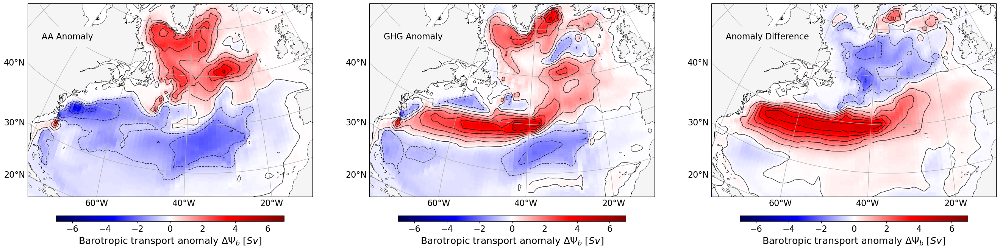

In [62]:
## Prepare plotting data for each dataset
plotting_data1 = prepare_data(bsf_aa_anomaly)*1e-12
plotting_data2 = prepare_data(bsf_ghg_anomaly)*1e-12
plotting_data3 = prepare_data(bsf_anomaly_difference)*1e-12

# Set up color and label sizes
cbar_kwargs = {
    'orientation': 'horizontal', 'shrink': 0.8, 'aspect': 40,
    'label': r'Barotropic transport anomaly $\Delta\Psi_b$ [$Sv$]', 'pad': 0.05
}
labelsize = 16

titles = [
    'AA Anomaly',
    'GHG Anomaly',
    'Anomaly Difference'
]

# Define plot limits
vmin = -7
vmax = 7

# Create a figure with 1 row and 3 columns
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(33, 13), 
    subplot_kw={'projection': ccrs.Orthographic(central_latitude=40, central_longitude=-35)})

# Set extent for each subplot and plot data
for ax, plotting_data, title in zip(axes, [plotting_data1, plotting_data2, plotting_data3], titles):
    ax.set_extent([-80, -10, 25, 60], crs=ccrs.PlateCarree())

    # Add cartopy feature for coastlines
    nature_coast = cartopy.feature.NaturalEarthFeature('physical', 'land', '50m', linewidth=0.5, edgecolor='black', facecolor='whitesmoke')

    # Plotting data as pcolormesh
    pc = plotting_data.where(mask > 0).plot.pcolormesh(
        ax=ax,
        transform=ccrs.PlateCarree(),
        x='TLONG',
        y='TLAT',
        cbar_kwargs=cbar_kwargs,
        cmap='seismic',
        vmin=vmin,
        vmax=vmax
    )

    # Adjust colorbar label size
    pc.colorbar.ax.tick_params(labelsize=labelsize)

    # Axis ticks
    ax.tick_params(axis='both', which='both', labelsize=labelsize, size=6)

    # Add gridlines
    gl = ax.gridlines(draw_labels=True, crs=ccrs.PlateCarree())
    gl.right_labels = False
    gl.top_labels = False
    gl.xlabel_style = {'size': labelsize}
    gl.ylabel_style = {'size': labelsize}

    # Add coastlines
    ax.add_feature(nature_coast)
    #ax.set_title(f'Plot {plotting_data.name}', fontsize=labelsize)  # Adjust title as needed

    # Contour settings
    #contour_levels = np.arange(np.floor(plotting_data.min().item()),
    #                           np.ceil(plotting_data.max().item()) + 0.5, 0.5)
    cs = ax.contour(plotting_data.TLONG, plotting_data.TLAT, 
                    plotting_data.where(mask > 0), 
                    levels=10, 
                    alpha=0.8,
                    linewidths=1, 
                    colors='black', 
                    transform=ccrs.PlateCarree())
    # Add varying text using the title variable in the specified line
    ax.text(0.05, 0.85, title, transform=ax.transAxes, fontsize=labelsize,
            verticalalignment='top', bbox={'boxstyle': 'round,pad=0.7', 'facecolor': 'whitesmoke', 'edgecolor': 'none'})

# Adjust layout
#plt.show()
plt.savefig('Figure_bsf_decrease_anomaly.png', bbox_inches='tight', dpi=300, transparent=True)

In [83]:
dmoc_aa_anomaly

<xarray.DataArray 'dMOC' (z_t: 60, nlat: 384)>
array([[        0.        ,         0.        ,         0.        , ...,
        -53826317.22109273,         0.        ,         0.        ],
       [        0.        ,         0.        ,         0.        , ...,
        -69284068.7932812 ,         0.        ,         0.        ],
       [        0.        ,         0.        ,         0.        , ...,
        -69088687.20766616,         0.        ,         0.        ],
       ...,
       [        0.        ,         0.        ,         0.        , ...,
         -2345379.73699547,         0.        ,         0.        ],
       [        0.        ,         0.        ,         0.        , ...,
         -2345379.73699547,         0.        ,         0.        ],
       [        0.        ,         0.        ,         0.        , ...,
         -2345379.73699547,         0.        ,         0.        ]])
Coordinates:
  * z_t      (z_t) float32 500.0 1.5e+03 2.5e+03 ... 5.125e+05 5.375e+05
  * nlat     (nlat) int64 0 1 2 3 4 5 6 7 8 ... 376 377 378 379 380 381 382 383
    ULONG    (nlat) float64 321.1 321.1 321.1 321.1 ... 320.5 320.5 320.5 320.4
    ULAT     (nlat) float64 -78.95 -78.42 -77.88 -77.35 ... 71.51 71.96 72.41
    TLONG    (nlat) float64 320.6 320.6 320.6 320.6 ... 320.3 320.3 320.2 320.2
    TLAT     (nlat) float64 -79.22 -78.69 -78.15 -77.62 ... 71.29 71.74 72.19

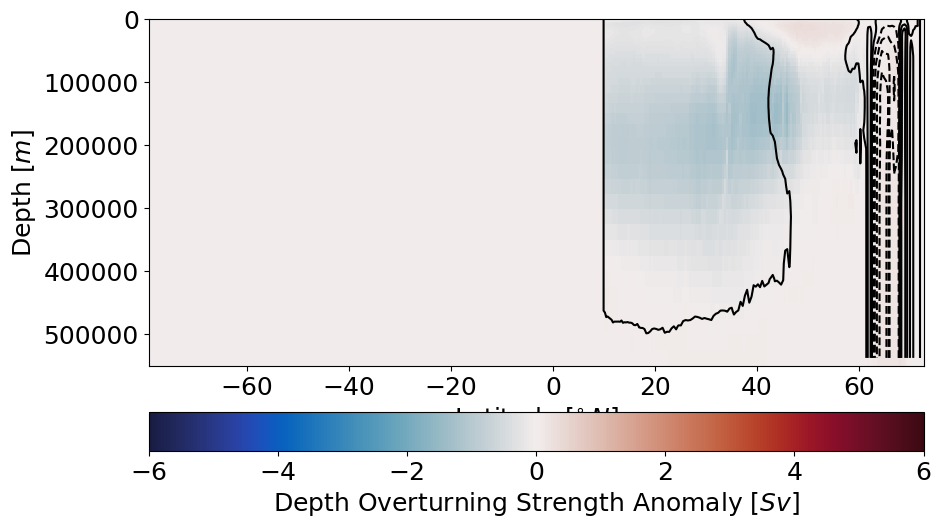

In [87]:
plotting_data1 = dmoc_aa_anomaly * 1e-12  # Ensure this is defined

# Set limits for the plot
vmin = -6
vmax = 6

# Create the figure and axis
fig, ax = plt.subplots(figsize=(10, 6))

# Create pcolormesh
pc = ax.pcolormesh(plotting_data1.ULAT, plotting_data1.z_t, plotting_data1, 
                   cmap=cmo.balance, vmin=vmin, vmax=vmax)

# Add colorbar
cbar = plt.colorbar(pc, ax=ax, orientation='horizontal', 
                    pad=0.1, label='Depth Overturning Strength Anomaly [$Sv$]')

# Set axis labels
ax.set_ylabel('Depth [$m$]')
ax.set_xlabel('Latitude [$^{\circ}\,N$]')

plt.contour(plotting_data.ULAT, plotting_data.z_t, plotting_data, colors='k')

# Invert y-axis
ax.invert_yaxis()

# Show the plot
plt.show()

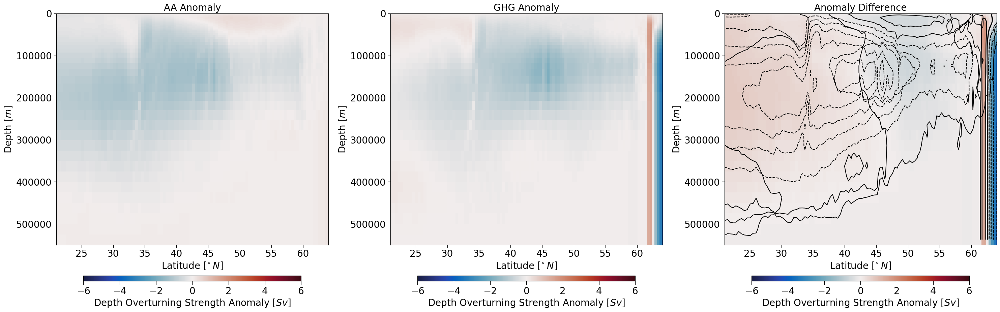

In [88]:
#
# Prepare plotting data for each dataset
plotting_data1 = dmoc_aa_anomaly * 1e-12
plotting_data2 = dmoc_ghg_anomaly * 1e-12
plotting_data3 = dmoc_anomaly_difference * 1e-12


# Set up label size and colorbar arguments
labelsize = 20
cbar_kwargs = {
    'orientation': 'horizontal', 
    'shrink': 0.8, 
    'aspect': 40,
    'label': 'Depth Overturning Strength Anomaly [$Sv$]', 
    'pad': 0.1
}

titles = [
    'AA Anomaly',
    'GHG Anomaly',
    'Anomaly Difference'
]

# Define plot limits
vmin = -6
vmax = 6

# Create the figure and axes for 3 subplots
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(30, 10))

# Loop through each dataset and plot
for ax, plotting_data, title in zip(axes, [plotting_data1, plotting_data2, plotting_data3], titles):
    
    
    
    
    
    
    # Plot the pcolormesh
    pc = ax.pcolormesh(plotting_data.ULAT, plotting_data.z_t, plotting_data, 
                       cmap=cmo.balance, 
                       vmin=vmin, vmax=vmax)

    # Add contour lines
    plt.contour(plotting_data.ULAT, plotting_data.z_t, plotting_data, colors='k')

    # Add colorbar
    cbar = plt.colorbar(pc, ax=ax, **cbar_kwargs)
    cbar.ax.xaxis.label.set_size(labelsize)
    cbar.ax.tick_params(axis='x', labelsize=labelsize, size=8)

    # Set axis parameters
    ax.tick_params(axis='both', which='both', labelsize=labelsize, size=6)
    ax.set_title(title, fontsize=labelsize)

    ax.invert_yaxis()  # Invert the y-axis
    ax.set_xlim([21, 64])  # Set latitude limits
    #ax.set_ylim([3500, 0])  # Set depth limits

    ax.set_ylabel(r'Depth [$m$]', fontsize=labelsize)
    ax.set_xlabel(r'Latitude [$^{\circ}\,N$]', fontsize=labelsize)

# Adjust layout
plt.tight_layout()

# Save the figure
#plt.savefig(os.path.expanduser('~/phase1_CONDA/results/') + 'dmoc_anomaly.png', bbox_inches='tight', dpi=300, transparent=True)

# Show the plot if desired (optional)
plt.show()

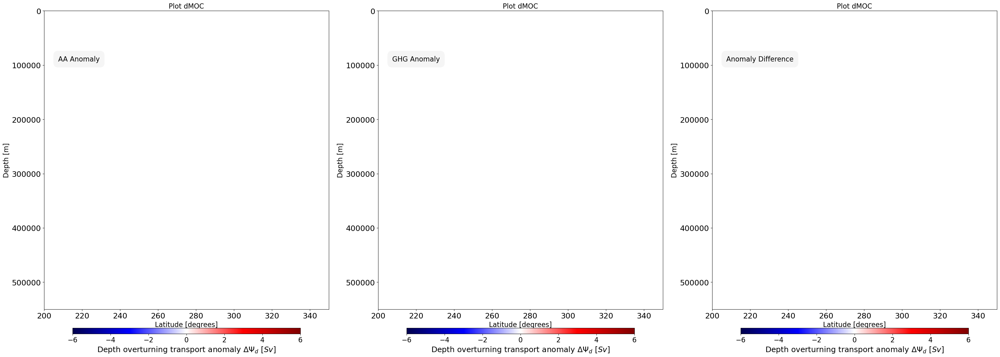

In [78]:
# Prepare plotting data for each dataset
plotting_data1 = dmoc_aa_anomaly*1e-12
plotting_data2 = dmoc_ghg_anomaly*1e-12
plotting_data3 = dmoc_anomaly_difference*1e-12

# Set up color and label sizes
cbar_kwargs = {
    'orientation': 'horizontal', 'shrink': 0.8, 'aspect': 40,
    'label': r'Depth overturning transport anomaly $\Delta\Psi_d$ [$Sv$]', 'pad': 0.05
}
labelsize = 16

titles = [
    'AA Anomaly',
    'GHG Anomaly',
    'Anomaly Difference'
]

# Define plot limits
vmin = -6
vmax = 6

# Define depth limits (adjust the range as needed)
depth_min = 0   # Minimum depth (adjust as necessary)
depth_max = 4000  # Maximum depth (adjust as necessary)

# Create a figure with 1 row and 3 columns
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(33, 13))

# Set extent for each subplot and plot data
for ax, plotting_data, title in zip(axes, [plotting_data1, plotting_data2, plotting_data3], titles):
    # Plotting data as pcolormesh
    pc = plotting_data.plot.pcolormesh(
        ax=ax,
        x='ULAT',  # Latitude variable
        y='z_t',   # Depth variable
        cbar_kwargs=cbar_kwargs,
        cmap='seismic',
        vmin=vmin,
        vmax=vmax
    )

    # Adjust colorbar label size
    pc.colorbar.ax.tick_params(labelsize=labelsize)

    # Set latitude and depth limits
    #ax.set_ylim(depth_min, depth_max)  # Restrict depth range
    ax.set_xlim(200, 350)  # Restrict depth range

    # Set axis labels and title
    ax.set_xlabel('Latitude [degrees]', fontsize=labelsize)  # Updated label for latitude
    ax.set_ylabel('Depth [m]', fontsize=labelsize)
    ax.set_title(f'Plot {plotting_data.name}', fontsize=labelsize)

    # Add contours (you can adjust levels as needed)
    contour_levels = np.linspace(vmin, vmax, 0)  # Define levels for contours
    contours = ax.contour(plotting_data['TLAT'], plotting_data['z_t'], plotting_data,
                           levels=contour_levels, colors='black', linewidths=1)  # Using nlat here
    ax.clabel(contours, inline=True, fontsize=20, fmt='%.1f')  # Add labels to contours
    
    # Add varying text using the title variable in the specified line
    ax.text(0.05, 0.85, title, transform=ax.transAxes, fontsize=labelsize,
            verticalalignment='top', bbox={'boxstyle': 'round,pad=0.7', 'facecolor': 'whitesmoke', 'edgecolor': 'none'})

    ax.invert_yaxis()
    
# Adjust layout
plt.tight_layout()
plt.show()
# plt.savefig('Figure_dmoc_decrease_anomalies.png', bbox_inches='tight', dpi=300)

# SHF and HMXL

## Flipbooks

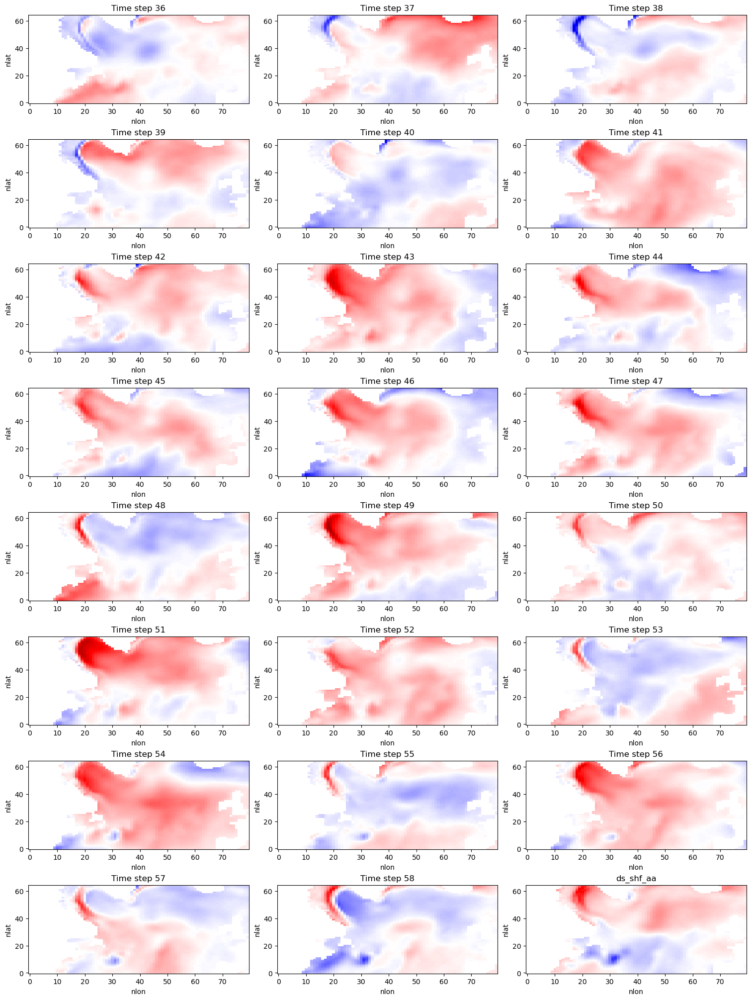

In [21]:
vmin = -150
vmax = 150

fig, axs = plt.subplots(8, 3, figsize=(15, 20), constrained_layout=True)

# Flatten the array of axes for easy indexing
axs = axs.flatten()

# Loop through the specified time steps and create subplots
for i, time_step in enumerate(range(36, 60)):
    
    ds = ds_shf_aa.SHF - ds_shf_aa.SHF.isel(time=slice(0, 40)).mean('time')
    data = ds.isel(time=time_step, nlat=slice(300, 365), nlon=slice(180,260))
    data.plot(ax=axs[i], 
              add_colorbar=False,
              cmap='seismic',
              vmin=vmin, vmax=vmax)
    axs[i].set_title(f'Time step {time_step}')
    
plt.title('ds_shf_aa')
plt.show()

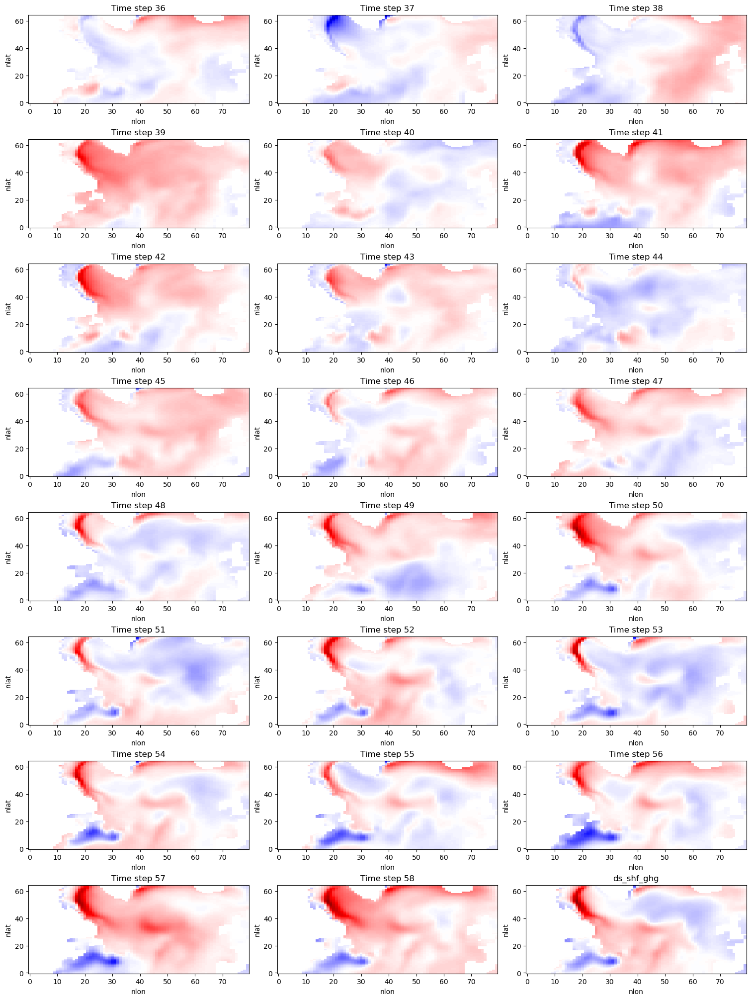

In [19]:
vmin = -150
vmax = 150

fig, axs = plt.subplots(8, 3, figsize=(15, 20), constrained_layout=True)

# Flatten the array of axes for easy indexing
axs = axs.flatten()

# Loop through the specified time steps and create subplots
for i, time_step in enumerate(range(36, 60)):
    
    ds = ds_shf_ghg.SHF - ds_shf_ghg.SHF.isel(time=slice(0, 40)).mean('time')
    data = ds.isel(time=time_step, nlat=slice(300, 365), nlon=slice(180,260))
    data.plot(ax=axs[i], 
              add_colorbar=False,
              cmap='seismic',
              vmin=vmin, vmax=vmax)
    axs[i].set_title(f'Time step {time_step}')
    
plt.title('ds_shf_ghg')
plt.show()

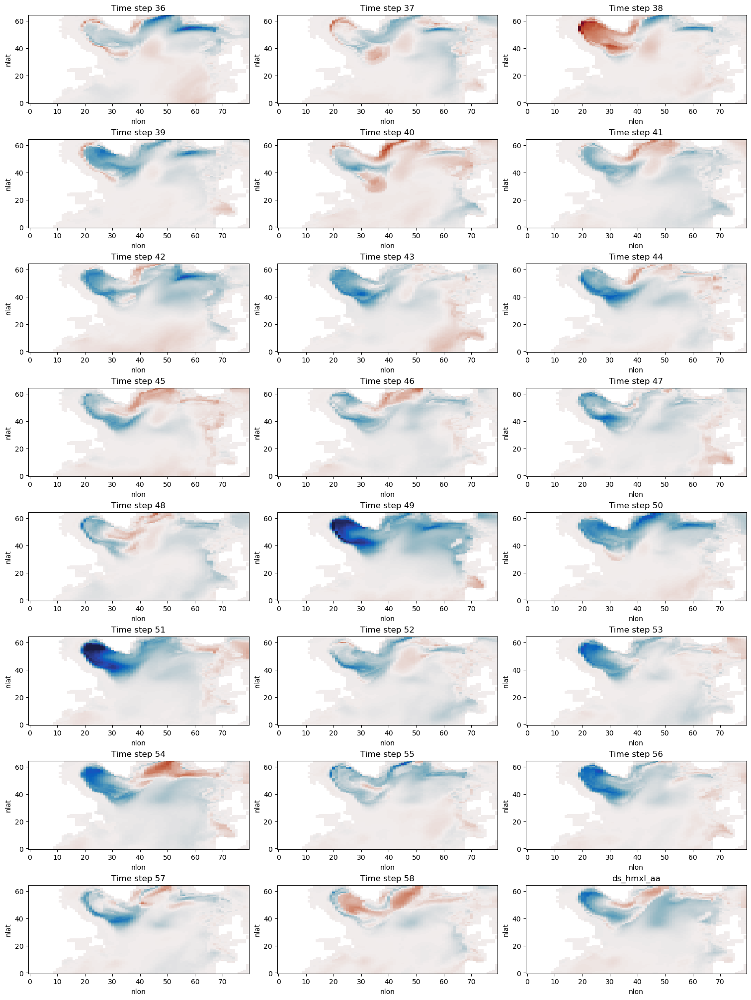

In [22]:
vmin = -300
vmax = 300

fig, axs = plt.subplots(8, 3, figsize=(15, 20), constrained_layout=True)

# Flatten the array of axes for easy indexing
axs = axs.flatten()

# Loop through the specified time steps and create subplots
for i, time_step in enumerate(range(36, 60)):
    
    ds = ds_hmxl_aa.HMXL - ds_hmxl_aa.HMXL.isel(time=slice(0, 40)).mean('time')
    data = ds.isel(time=time_step, nlat=slice(300, 365), nlon=slice(180,260))
    data.plot(ax=axs[i], 
              add_colorbar=False,
              cmap=cmo.balance,
              vmin=vmin, vmax=vmax)
    axs[i].set_title(f'Time step {time_step}')
    
plt.title('ds_hmxl_aa')
plt.show()

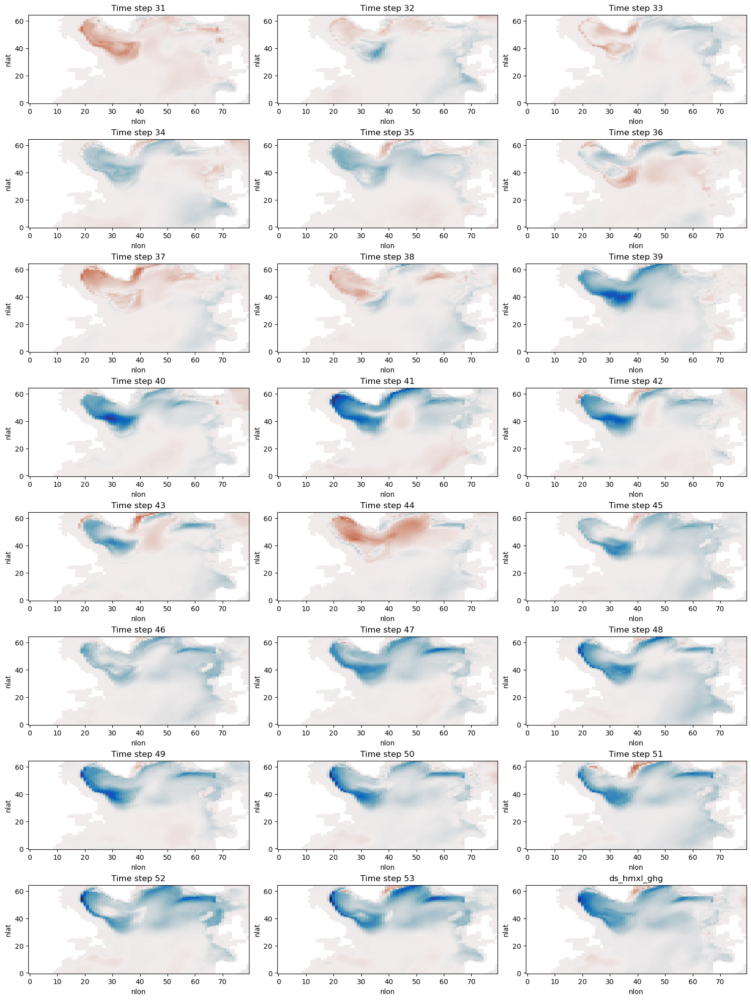

In [60]:
vmin = -300
vmax = 300

fig, axs = plt.subplots(8, 3, figsize=(15, 20), constrained_layout=True)

# Flatten the array of axes for easy indexing
axs = axs.flatten()

# Loop through the specified time steps and create subplots
for i, time_step in enumerate(range(36, 60)):
    
    ds = ds_hmxl_ghg.HMXL - ds_hmxl_ghg.HMXL.isel(time=slice(0, 40)).mean('time')
    data = ds.isel(time=time_step, nlat=slice(300, 365), nlon=slice(180,260))
    data.plot(ax=axs[i], 
              add_colorbar=False,
              cmap=cmo.balance,
              vmin=vmin, vmax=vmax)
    axs[i].set_title(f'Time step {time_step}')
    
plt.title('ds_hmxl_ghg')
plt.show()

## Anomalies

In [18]:
hmxl_aa_anomaly = ds_hmxl_aa.HMXL.isel(time=slice(41,59)).mean('time')-ds_hmxl_aa.HMXL.isel(time=slice(0,40)).mean('time')
hmxl_ghg_anomaly = ds_hmxl_ghg.HMXL.isel(time=slice(41,59)).mean('time')-ds_hmxl_aa.HMXL.isel(time=slice(0,40)).mean('time')
hmxl_anomaly_difference = hmxl_ghg_anomaly - hmxl_aa_anomaly

In [19]:
shf_aa_anomaly = ds_shf_aa.SHF.isel(time=slice(41,59)).mean('time')-ds_shf_aa.SHF.isel(time=slice(0,40)).mean('time')
shf_ghg_anomaly = ds_shf_ghg.SHF.isel(time=slice(41,59)).mean('time')-ds_shf_aa.SHF.isel(time=slice(0,40)).mean('time')
shf_anomaly_difference = shf_ghg_anomaly - shf_aa_anomaly

### Plotting comparison of time periods

In [31]:
# Function to prepare the data
def prepare_data(da):
    da = da.roll(nlon=+100)

    replacement_value = 0
    da['TLAT'] = xr.where(
        np.logical_or(np.isnan(da['TLAT']), np.logical_or(np.isinf(da['TLAT']), np.ma.getmask(da['TLAT']))),
        replacement_value,
        da['TLAT'])
    da['TLONG'] = xr.where(
        np.logical_or(np.isnan(da['TLONG']), np.logical_or(np.isinf(da['TLONG']), np.ma.getmask(da['TLONG']))),
        replacement_value,
        da['TLONG'])
    
    return da

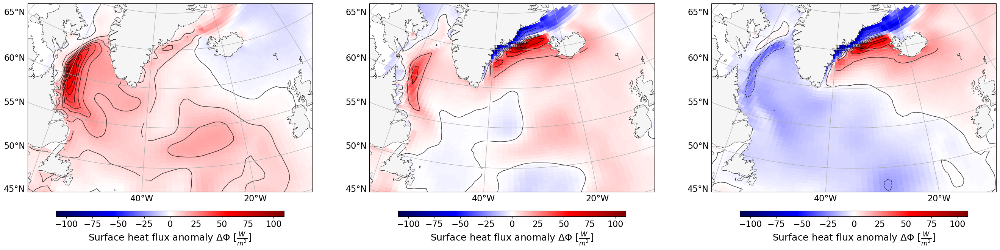

In [40]:
# Prepare plotting data for each dataset
plotting_data1 = prepare_data(shf_aa_anomaly)
plotting_data2 = prepare_data(shf_ghg_anomaly)
plotting_data3 = prepare_data(shf_anomaly_difference)

# Set up color and label sizes
cbar_kwargs = {
    'orientation': 'horizontal', 'shrink': 0.8, 'aspect': 40,
    'label': r'Surface heat flux anomaly $\Delta\Phi$ [$\frac{W}{m^2}$]', 'pad': 0.05
}
labelsize = 16

# Define plot limits
vmin = -110
vmax = 110

# Create a figure with 1 row and 3 columns
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(33, 13), subplot_kw={'projection': ccrs.Orthographic(central_latitude=40, central_longitude=-35)})

# Set extent for each subplot and plot data
for ax, plotting_data in zip(axes, [plotting_data1, plotting_data2, plotting_data3]):
    ax.set_extent([-60, -10, 45, 70], crs=ccrs.PlateCarree())

    # Add cartopy feature for coastlines
    nature_coast = cartopy.feature.NaturalEarthFeature('physical', 'land', '50m', linewidth=0.5, edgecolor='black', facecolor='whitesmoke')

    # Plotting data as pcolormesh
    pc = plotting_data.plot.pcolormesh(
        ax=ax,
        transform=ccrs.PlateCarree(),
        x='TLONG',
        y='TLAT',
        cbar_kwargs=cbar_kwargs,
        cmap='seismic',
        vmin=vmin,
        vmax=vmax
    )

    # Adjust colorbar label size
    pc.colorbar.ax.tick_params(labelsize=labelsize)

    # Axis ticks
    ax.tick_params(axis='both', which='both', labelsize=labelsize, size=6)

    # Add gridlines
    gl = ax.gridlines(draw_labels=True, crs=ccrs.PlateCarree())
    gl.right_labels = False
    gl.top_labels = False
    gl.xlabel_style = {'size': labelsize}
    gl.ylabel_style = {'size': labelsize}

    # Add coastlines
    ax.add_feature(nature_coast)
    #ax.set_title(f'Plot {plotting_data.name}', fontsize=labelsize)  # Adjust title as needed

    # Contour settings
    contour_levels = np.arange(np.floor(plotting_data.min().item()),
                               np.ceil(plotting_data.max().item()) + 0.5, 0.5)
    cs = ax.contour(plotting_data.TLONG, plotting_data.TLAT, 
                    plotting_data.where(mask > 0), 
                    levels=10, 
                    alpha=0.8,
                    linewidths=1, 
                    colors='black', 
                    transform=ccrs.PlateCarree())

# Adjust layout
plt.show()
#plt.savefig('Figure_shf_decrease_anomaly.png', bbox_inches='tight', dpi=300)

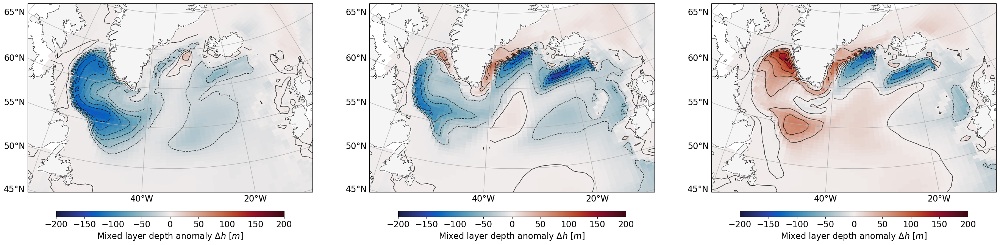

In [33]:
# Prepare plotting data for each dataset
plotting_data1 = prepare_data(hmxl_aa_anomaly)
plotting_data2 = prepare_data(hmxl_ghg_anomaly)
plotting_data3 = prepare_data(hmxl_anomaly_difference)

# Set up color and label sizes
cbar_kwargs = {
    'orientation': 'horizontal', 'shrink': 0.8, 'aspect': 40,
    'label': r'Mixed layer depth anomaly $\Delta h$ [$m$]', 'pad': 0.05
}
labelsize = 16

# Define plot limits
vmin = -200
vmax = 200

# Create a figure with 1 row and 3 columns
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(33, 13), subplot_kw={'projection': ccrs.Orthographic(central_latitude=40, central_longitude=-35)})

# Set extent for each subplot and plot data
for ax, plotting_data in zip(axes, [plotting_data1, plotting_data2, plotting_data3]):
    ax.set_extent([-60, -10, 45, 70], crs=ccrs.PlateCarree())

    # Add cartopy feature for coastlines
    nature_coast = cartopy.feature.NaturalEarthFeature('physical', 'land', '50m', linewidth=0.5, edgecolor='black', facecolor='whitesmoke')

    # Plotting data as pcolormesh
    pc = plotting_data.plot.pcolormesh(
        ax=ax,
        transform=ccrs.PlateCarree(),
        x='TLONG',
        y='TLAT',
        cbar_kwargs=cbar_kwargs,
        cmap=cmo.balance,
        vmin=vmin,
        vmax=vmax
    )

    # Adjust colorbar label size
    pc.colorbar.ax.tick_params(labelsize=labelsize)
    pc.colorbar.set_label(r'Mixed layer depth anomaly $\Delta h$ [$m$]', size=labelsize)

    # Axis ticks
    ax.tick_params(axis='both', which='both', labelsize=labelsize, size=6)

    # Add gridlines
    gl = ax.gridlines(draw_labels=True, crs=ccrs.PlateCarree())
    gl.right_labels = False
    gl.top_labels = False
    gl.xlabel_style = {'size': labelsize}
    gl.ylabel_style = {'size': labelsize}

    # Add coastlines
    ax.add_feature(nature_coast)
    #ax.set_title(f'Plot {plotting_data.name}', fontsize=labelsize)  # Adjust title as needed

    # Contour settings
    contour_levels = np.arange(np.floor(plotting_data.min().item()),
                               np.ceil(plotting_data.max().item()) + 0.5, 0.5)
    cs = ax.contour(plotting_data.TLONG, plotting_data.TLAT, 
                    plotting_data.where(mask > 0), 
                    levels=10, 
                    alpha=0.8,
                    linewidths=1, 
                    colors='black', 
                    transform=ccrs.PlateCarree())

# Adjust layout
plt.show()
#plt.savefig('Figure_hmxl_decrease_anomaly.png', bbox_inches='tight', dpi=300)

### Plotting single anomalies

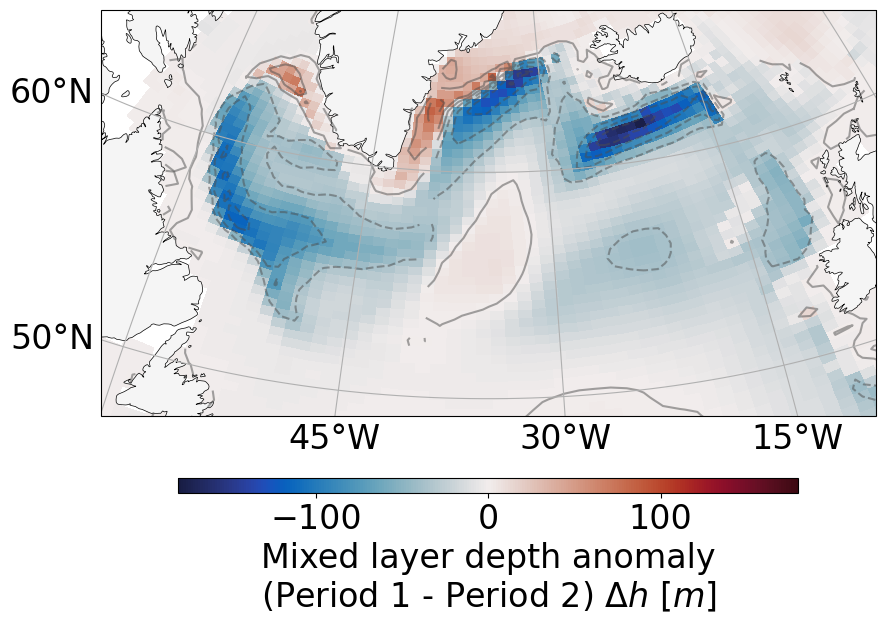

In [26]:
choice = 3
labelsize = 24 

if choice == 0:
    da = shf_aa_anomaly.roll(nlon=+100)
    save_name = 'Figure_anomaly_shf_aa.png'
    anom = 'shf'
elif choice == 1:
    da = shf_ghg_anomaly.roll(nlon=+100)
    save_name = 'Figure_anomaly_shf_ghg.png'
    anom = 'shf'
elif choice == 2:
    da = hmxl_aa_anomaly.roll(nlon=+100)
    save_name = 'Figure_anomaly_hmxl_aa.png'
    anom = 'hmxl'
elif choice == 3:
    da = hmxl_ghg_anomaly.roll(nlon=+100)
    save_name = 'Figure_anomaly_hmxl_ghg.png'
    anom = 'hmxl'

if anom == 'shf':
    cbar_kwargs = {
    'orientation': 'horizontal', 'shrink': 0.8, 'aspect': 40,
    'label': r'Surface heat flux anomaly'+'\n'+ r'(Period 1 - Period 2) $\Delta\Phi$ [$\frac{W}{m^2}$]', 'pad': 0.1}
    vmin = -110
    vmax = 110
    n_levels = 17
    cmap = 'seismic'
    
elif anom == 'hmxl':
    cbar_kwargs = {
    'orientation': 'horizontal', 'shrink': 0.8, 'aspect': 40,
    'label': r'Mixed layer depth anomaly'+'\n'+ r'(Period 1 - Period 2) $\Delta h$ [$m$]', 'pad': 0.1}
    vmin = -180
    vmax = 180
    n_levels = 11
    label =r'Mixed layer depth anomaly $\Delta h$ [$m$]'
    cmap = cmo.balance

replacement_value = 0
da['TLAT'] = xr.where(
    np.logical_or(np.isnan(da['TLAT']), np.logical_or(np.isinf(da['TLAT']), np.ma.getmask(da['TLAT']))),
    replacement_value,
    da['TLAT'])
da['TLONG'] = xr.where(
    np.logical_or(np.isnan(da['TLONG']), np.logical_or(np.isinf(da['TLONG']), np.ma.getmask(da['TLONG']))),
    replacement_value,
    da['TLONG'])


plotting_data = da


# Plot configuration
plt.figure(figsize=(10, 8))
ax = plt.axes(projection=ccrs.Orthographic(central_latitude=40, central_longitude=-35))
ax.set_extent([-60, -10, 47, 66], crs=ccrs.PlateCarree())
pc = plotting_data.plot.pcolormesh( ax=ax, transform=ccrs.PlateCarree(), x='TLONG', y='TLAT',
    cbar_kwargs=cbar_kwargs, cmap=cmap, vmin=vmin, vmax=vmax)
pc.colorbar.ax.tick_params(labelsize=labelsize)
cbar = pc.colorbar
cbar.set_label(cbar_kwargs['label'], fontsize=labelsize)  # Set colorbar label font size
cbar.ax.tick_params(labelsize=labelsize)  # Set colorbar tick font size

#ax.tick_params(axis='both', which='both', labelsize=labelsize, size=6)
gl = ax.gridlines(draw_labels=True, crs=ccrs.PlateCarree())
gl.right_labels = False
gl.top_labels = False
gl.xlabel_style = {'size': labelsize}
gl.ylabel_style = {'size': labelsize}
gl.xlocator = ticker.MultipleLocator(15) 
gl.ylocator = ticker.MultipleLocator(10)


ax.add_feature(nature_coast)
cs = ax.contour(plotting_data.TLONG, plotting_data.TLAT, 
                plotting_data.where(mask > 0), 
                levels = np.linspace(vmin, vmax, n_levels),
                linewidths=1.5, colors='#4d4d4d', alpha=0.5, transform=ccrs.PlateCarree())
#ax.clabel(cs, fmt='%1.0f', inline=True, fontsize=labelsize)
    
plt.savefig(save_name, bbox_inches='tight', dpi=300, transparent=True)
#plt.show()

# Timeseries

- SSS, SST, HC, FWC
- HMXL, SHF, DENS
- smoc, BSF, dMOC


In [13]:
grid_name = 'POP_gx1v7'
region_defs = {
    'SubpolarAtlantic': [
        {'match': {'REGION_MASK': [6]}, 'bounds': {'TLAT': [50.0, 65.0], 'TLONG': [200.0, 360.0]}}
    ],
    'LabradorSea': [
        {'match': {'REGION_MASK': [8]}, 'bounds': {'TLAT': [50.0, 65.0], 'TLONG': [260.0, 360.0]}}
    ]
}

# Create mask for selected regions
spna_mask = pop_tools.region_mask_3d(grid_name, region_defs=region_defs, mask_name='North Atlantic')
spna_mask = spna_mask.sum('region').roll(nlon=-100)

In [14]:
horizontal_weights = ds_temp_aa.TAREA.fillna(0)
weights = (ds_temp_aa.z_t.where(spna_mask == 1) * ds_temp_aa.z_t.where(spna_mask == 1)).fillna(0)

In [15]:
# Mean SST and SSS for AA
sst_aa = (ds_temp_aa.TEMP.where(spna_mask == 1).isel(z_t=0)
    .weighted(horizontal_weights).mean(['nlat', 'nlon']))
sss_aa = (ds_salt_aa.SALT.where(spna_mask == 1).isel(z_t=0)
    .weighted(horizontal_weights).mean(['nlat', 'nlon']))

# Mean SST and SSS for GHG
sst_ghg = (ds_temp_ghg.TEMP.where(spna_mask == 1).isel(z_t=0)
    .weighted(horizontal_weights).mean(['nlat', 'nlon']))
sss_ghg = (ds_salt_ghg.SALT.where(spna_mask == 1).isel(z_t=0)
    .weighted(horizontal_weights).mean(['nlat', 'nlon']))

In [16]:
# HC and FWC
rho_sw = 1026  # density of seawater in kg/m^3
cp_sw = 3990  # specific heat of seawater in J/(kg·K)
dz = ds_temp_aa.dz * 1e-2
UAREA = ds_temp_aa.UAREA * 1e-4
S_ref = 35  # PSU

hc_aa = (rho_sw * cp_sw * (dz * UAREA * ds_temp_aa.TEMP)
         .sum(dim=['nlat', 'nlon', 'z_t']))
fwc_aa = (((S_ref - ds_salt_aa.SALT) / S_ref * dz * UAREA)
          .sum(dim=['nlat', 'nlon', 'z_t']))

hc_ghg = (rho_sw * cp_sw * (dz * UAREA * ds_temp_ghg.TEMP)
         .sum(dim=['nlat', 'nlon', 'z_t']))
fwc_ghg = (((S_ref - ds_salt_ghg.SALT) / S_ref * dz * UAREA)
          .sum(dim=['nlat', 'nlon', 'z_t']))

In [17]:
# HMXL, SHF, DENS
hmxl_aa = (ds_hmxl_aa.HMXL.where(spna_mask == 1)
    .weighted(horizontal_weights).mean(['nlat', 'nlon']))
shf_aa = (ds_shf_aa.SHF.where(spna_mask == 1)
    .weighted(horizontal_weights).mean(['nlat', 'nlon']))
dens_aa = (ds_dens_aa.DENS2.where(spna_mask == 1)
           .weighted(weights).mean(dim=['nlat', 'nlon', 'z_t']))

hmxl_ghg = (ds_hmxl_ghg.HMXL.where(spna_mask == 1)
    .weighted(horizontal_weights).mean(['nlat', 'nlon']))
shf_ghg = (ds_shf_ghg.SHF.where(spna_mask == 1)
    .weighted(horizontal_weights).mean(['nlat', 'nlon']))
dens_ghg = (ds_dens_ghg.DENS2.where(spna_mask == 1)
           .weighted(weights).mean(dim=['nlat', 'nlon', 'z_t']))

In [18]:
# SMOC, DMOC, BSF
smoc_aa = (ds_smoc_aa.sMOC.isel(nlat=340).max('density_bin')*1e-12)
dmoc_aa = (ds_smoc_aa.sMOC.isel(nlat=280).max('density_bin')*1e-12)
bsf_aa = (ds_bsf_aa.BSF.where(spna_mask == 1).min(dim=['nlat', 'nlon'])*1e-12)

smoc_ghg = (ds_smoc_ghg.sMOC.isel(nlat=340).max('density_bin')*1e-12)
dmoc_ghg = (ds_smoc_ghg.sMOC.isel(nlat=280).max('density_bin')*1e-12)
bsf_ghg = (ds_bsf_ghg.BSF.where(spna_mask == 1).min(dim=['nlat', 'nlon'])*1e-12)

In [19]:
def normalise_time_series(timeseries):
    mean_initial = timeseries.isel(time=slice(0, 40)).mean('time')
    std_initial = timeseries.isel(time=slice(0, 40)).mean('time')
    delta_timeseries = (timeseries - mean_initial) / std_initial
    return delta_timeseries

In [20]:
# SST and SSS
delta_sst_aa = normalise_time_series(sst_aa)
delta_sss_aa = normalise_time_series(sss_aa)
delta_sst_ghg = normalise_time_series(sst_ghg)
delta_sss_ghg = normalise_time_series(sss_ghg)

# HC and FWC
delta_hc_aa = normalise_time_series(hc_aa)
delta_fwc_aa = normalise_time_series(fwc_aa)
delta_hc_ghg = normalise_time_series(hc_ghg)
delta_fwc_ghg = normalise_time_series(fwc_ghg)

# HMXL, SHF, DENS
delta_hmxl_aa = normalise_time_series(hmxl_aa)
delta_shf_aa = normalise_time_series(shf_aa)
delta_dens_aa = normalise_time_series(dens_aa)
delta_hmxl_ghg = normalise_time_series(hmxl_ghg)
delta_shf_ghg = normalise_time_series(shf_ghg)
delta_dens_ghg = normalise_time_series(dens_ghg)

# SMOC, DMOC, BSF
delta_smoc_aa = normalise_time_series(smoc_aa)
delta_dmoc_aa = normalise_time_series(dmoc_aa)
delta_bsf_aa = normalise_time_series(bsf_aa)
delta_smoc_ghg = normalise_time_series(smoc_ghg)
delta_dmoc_ghg = normalise_time_series(dmoc_ghg)
delta_bsf_ghg = normalise_time_series(bsf_ghg)

## all time series

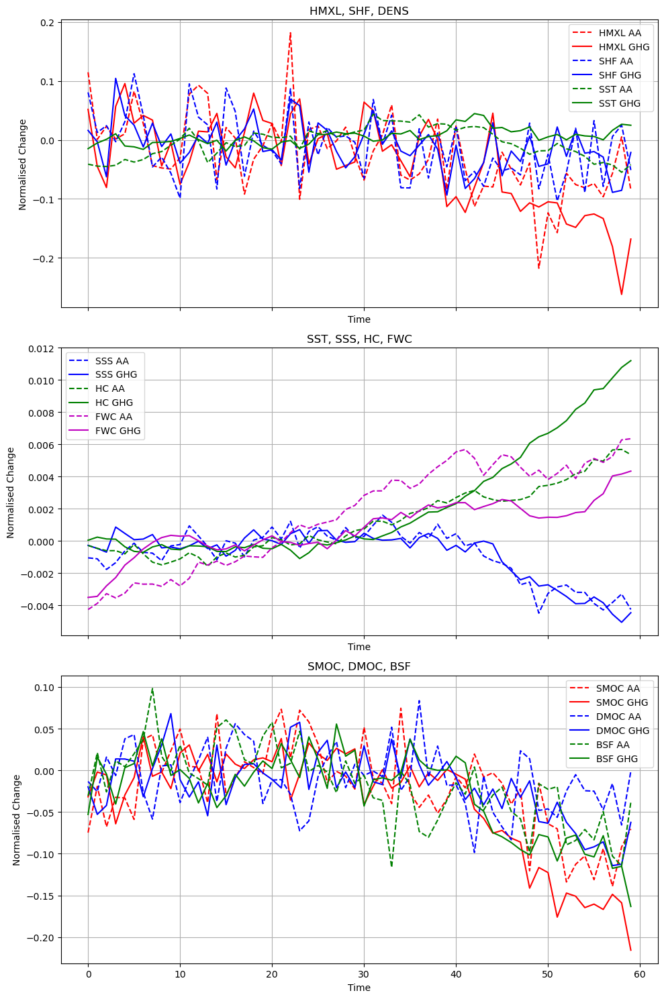

In [128]:
# Create a figure with three subplots
fig, axs = plt.subplots(3, 1, figsize=(10, 15), sharex=True)

# Top subplot: SST, SSS, HC, FWC
axs[0].plot(delta_hmxl_aa.time, delta_hmxl_aa, 'r--', label='HMXL AA')  # Dotted line for AA
axs[0].plot(delta_hmxl_ghg.time, delta_hmxl_ghg, 'r-', label='HMXL GHG')  # Solid line for GHG
axs[0].plot(delta_shf_aa.time, delta_shf_aa, 'b--', label='SHF AA')  # Dotted line for AA
axs[0].plot(delta_shf_ghg.time, delta_shf_ghg, 'b-', label='SHF GHG')  # Solid line for GHG
axs[0].plot(delta_sst_aa.time, delta_sst_aa, 'g--', label='SST AA')  # Dotted line for AA
axs[0].plot(delta_sst_ghg.time, delta_sst_ghg, 'g-', label='SST GHG')  # Solid line for GHG
#axs[0].plot(delta_dens_aa.time, delta_dens_aa, 'm--', label='DENS AA')  # Dotted line for AA
#axs[0].plot(delta_dens_ghg.time, delta_dens_ghg, 'm-', label='DENS GHG')  # Solid line for GHG
axs[0].set_title('HMXL, SHF, DENS')
axs[0].legend()
axs[0].grid()

# Middle subplot: HMXL, SHF, DENS
axs[1].plot(delta_sss_aa.time, delta_sss_aa, 'b--', label='SSS AA')  # Dotted line for AA
axs[1].plot(delta_sss_ghg.time, delta_sss_ghg, 'b-', label='SSS GHG')  # Solid line for GHG
axs[1].plot(delta_hc_aa.time, delta_hc_aa, 'g--', label='HC AA')  # Dotted line for AA
axs[1].plot(delta_hc_ghg.time, delta_hc_ghg, 'g-', label='HC GHG')  # Solid line for GHG
axs[1].plot(delta_fwc_aa.time, delta_fwc_aa, 'm--', label='FWC AA')  # Dotted line for AA
axs[1].plot(delta_fwc_ghg.time, delta_fwc_ghg, 'm-', label='FWC GHG')  # Solid line for GHG
axs[1].set_title('SST, SSS, HC, FWC')
axs[1].legend()
axs[1].grid()

# Bottom subplot: SMOC, DMOC, BSF
axs[2].plot(delta_smoc_aa.time, delta_smoc_aa, 'r--', label='SMOC AA')  # Dotted line for AA
axs[2].plot(delta_smoc_ghg.time, delta_smoc_ghg, 'r-', label='SMOC GHG')  # Solid line for GHG
axs[2].plot(delta_dmoc_aa.time, delta_dmoc_aa, 'b--', label='DMOC AA')  # Dotted line for AA
axs[2].plot(delta_dmoc_ghg.time, delta_dmoc_ghg, 'b-', label='DMOC GHG')  # Solid line for GHG
axs[2].plot(delta_bsf_aa.time, delta_bsf_aa, 'g--', label='BSF AA')  # Dotted line for AA
axs[2].plot(delta_bsf_ghg.time, delta_bsf_ghg, 'g-', label='BSF GHG')  # Solid line for GHG
axs[2].set_title('SMOC, DMOC, BSF')
axs[2].legend()
axs[2].grid()

# Set common labels
for ax in axs:
    ax.set_ylabel('Normalised Change')
    ax.set_xlabel('Time')

plt.tight_layout()
plt.show()
#plt.savefig('Figure_Decrease.png', bbox_inches='tight', dpi=300)

## Figure to show

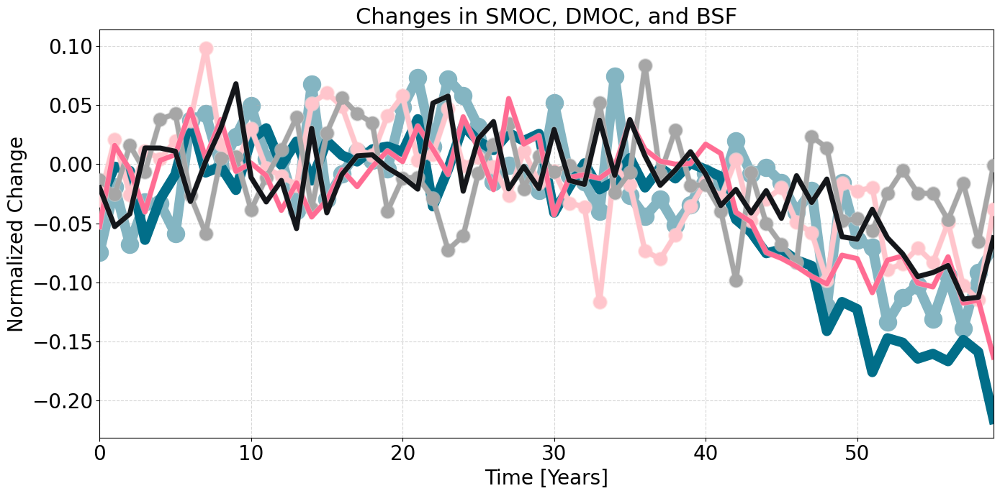

In [21]:
# Set up the plot
plt.figure(figsize=(14, 7))
#plt.gca().set_facecolor('#FFF7F8')  # Set background color
color_map = cmo.deep  # Assuming you've defined cmo
labelsize = 20

# SMOC
plt.plot(delta_smoc_aa.time, delta_smoc_aa, '#84B5C2', linewidth=10, alpha=1)
plt.scatter(delta_smoc_aa.time, delta_smoc_aa, color='#84B5C2', alpha=1, s=300)
plt.plot(delta_smoc_ghg.time, delta_smoc_ghg, '#016E89', linewidth=10, alpha=1)

# BSF
plt.plot(delta_bsf_aa.time, delta_bsf_aa, '#FFD9D8', linewidth=6, alpha=0.5, zorder=2)
plt.scatter(delta_bsf_aa.time, delta_bsf_aa, color='#FFD9D8', alpha=0.5, s=200, zorder=2)
plt.plot(delta_bsf_aa.time, delta_bsf_aa, '#FFC5CC', linewidth=5, zorder=3)
plt.scatter(delta_bsf_aa.time, delta_bsf_aa, color='#FFC5CC', alpha=1, s=150, zorder=3)


plt.plot(delta_bsf_ghg.time, delta_bsf_ghg, '#FFD9D8', linewidth=6, alpha=0.5, zorder=4)
plt.plot(delta_bsf_ghg.time, delta_bsf_ghg, '#FF6C93', linewidth=5, alpha=1, zorder=4)

# dMOC
plt.plot(delta_dmoc_aa.time, delta_dmoc_aa, '#CCCCCC', linewidth=6, alpha=0.5, zorder=2)
plt.scatter(delta_dmoc_aa.time, delta_dmoc_aa, color='#CCCCCC', alpha=0.5, s=200, zorder=2)
plt.plot(delta_dmoc_aa.time, delta_dmoc_aa, '#A6A6A6', linewidth=5, zorder=3)
plt.scatter(delta_dmoc_aa.time, delta_dmoc_aa, color='#A6A6A6', alpha=1, s=150, zorder=3)

plt.plot(delta_dmoc_ghg.time, delta_dmoc_ghg, '#CCCCCC', linewidth=6, alpha=0.5, zorder=4)
plt.plot(delta_dmoc_ghg.time, delta_dmoc_ghg, '#14161A', linewidth=5, alpha=1, zorder=4)


# Enhance plot aesthetics
plt.title('Changes in SMOC, DMOC, and BSF', fontsize=labelsize + 2)
plt.xlabel('Time [Years]', fontsize=labelsize)
plt.ylabel('Normalized Change', fontsize=labelsize)
plt.xticks(fontsize=labelsize)
plt.yticks(fontsize=labelsize)

# Custom x-axis limits and ticks
plt.xlim([delta_smoc_aa.time.min(), delta_smoc_aa.time.max()])
plt.grid(True, linestyle='--', alpha=0.5)  # Light grid for better visibility
#plt.legend(loc='upper left', fontsize=labelsize - 2, frameon=True, shadow=True)

# Show the plot and save it
plt.tight_layout()
#plt.savefig('Figure_smoc_dmoc_bsf_trend.png', bbox_inches='tight', dpi=300)
plt.show()

In [22]:
# Apply a 5-year sliding window average with handling for the first few years
window = 5

delta_smoc_aa_avg = delta_smoc_aa.rolling(time=window, min_periods=1).mean()
delta_smoc_ghg_avg = delta_smoc_ghg.rolling(time=window, min_periods=1).mean()
delta_bsf_aa_avg = delta_bsf_aa.rolling(time=window, min_periods=1).mean()
delta_bsf_ghg_avg = delta_bsf_ghg.rolling(time=window, min_periods=1).mean()
delta_dmoc_aa_avg = delta_dmoc_aa.rolling(time=window, min_periods=1).mean()
delta_dmoc_ghg_avg = delta_dmoc_ghg.rolling(time=window, min_periods=1).mean()

# Continue with plotting as previously shown

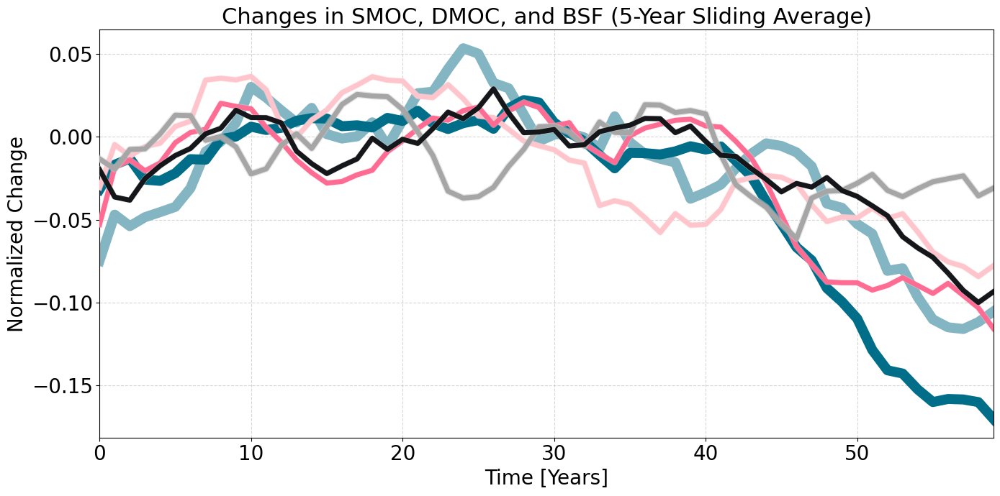

In [23]:
# Set up the plot
plt.figure(figsize=(14, 7))
color_map = cmo.deep
labelsize = 20

# SMOC
plt.plot(delta_smoc_aa_avg.time, delta_smoc_aa_avg, '#84B5C2', linewidth=10, alpha=1)
#plt.scatter(delta_smoc_aa.time, delta_smoc_aa, color='#84B5C2', alpha=1, s=50)
plt.plot(delta_smoc_ghg_avg.time, delta_smoc_ghg_avg, '#016E89', linewidth=10, alpha=1)

# BSF
plt.plot(delta_bsf_aa_avg.time, delta_bsf_aa_avg, '#FFD9D8', linewidth=6, alpha=0.5, zorder=2)
#plt.scatter(delta_bsf_aa_avg.time, delta_bsf_aa_avg, color='#FFD9D8', alpha=0.5, s=200, zorder=2)
plt.plot(delta_bsf_aa_avg.time, delta_bsf_aa_avg, '#FFC5CC', linewidth=5, zorder=3)
#plt.scatter(delta_bsf_aa_avg.time, delta_bsf_aa_avg, color='#FFC5CC', alpha=1, s=150, zorder=3)

plt.plot(delta_bsf_ghg_avg.time, delta_bsf_ghg_avg, '#FFD9D8', linewidth=6, alpha=0.5, zorder=4)
plt.plot(delta_bsf_ghg_avg.time, delta_bsf_ghg_avg, '#FF6C93', linewidth=5, alpha=1, zorder=4)

# DMOC
plt.plot(delta_dmoc_aa_avg.time, delta_dmoc_aa_avg, '#CCCCCC', linewidth=7, alpha=0.5, zorder=5)
#plt.scatter(delta_dmoc_aa_avg.time, delta_dmoc_aa_avg, color='#CCCCCC', alpha=0.5, s=200, zorder=2)
plt.plot(delta_dmoc_aa_avg.time, delta_dmoc_aa_avg, '#A6A6A6', linewidth=5, zorder=5)
#plt.scatter(delta_dmoc_aa_avg.time, delta_dmoc_aa_avg, color='#A6A6A6', alpha=1, s=150, zorder=3)

plt.plot(delta_dmoc_ghg_avg.time, delta_dmoc_ghg_avg, '#CCCCCC', linewidth=6, alpha=0.5, zorder=6)
plt.plot(delta_dmoc_ghg_avg.time, delta_dmoc_ghg_avg, '#14161A', linewidth=5, alpha=1, zorder=6)

# Enhance plot aesthetics
plt.title('Changes in SMOC, DMOC, and BSF (5-Year Sliding Average)', fontsize=labelsize + 2)
plt.xlabel('Time [Years]', fontsize=labelsize)
plt.ylabel('Normalized Change', fontsize=labelsize)
plt.xticks(fontsize=labelsize)
plt.yticks(fontsize=labelsize)

# Set custom x-axis limits and ticks
plt.xlim([delta_smoc_aa.time.min(), delta_smoc_aa.time.max()])
plt.grid(True, linestyle='--', alpha=0.5)  # Light grid for better visibility

# Show the plot
plt.tight_layout()
plt.show()

#plt.savefig('Figure_decrease_streamfunctions.png', bbox_inches='tight', dpi=300, transparent=True)

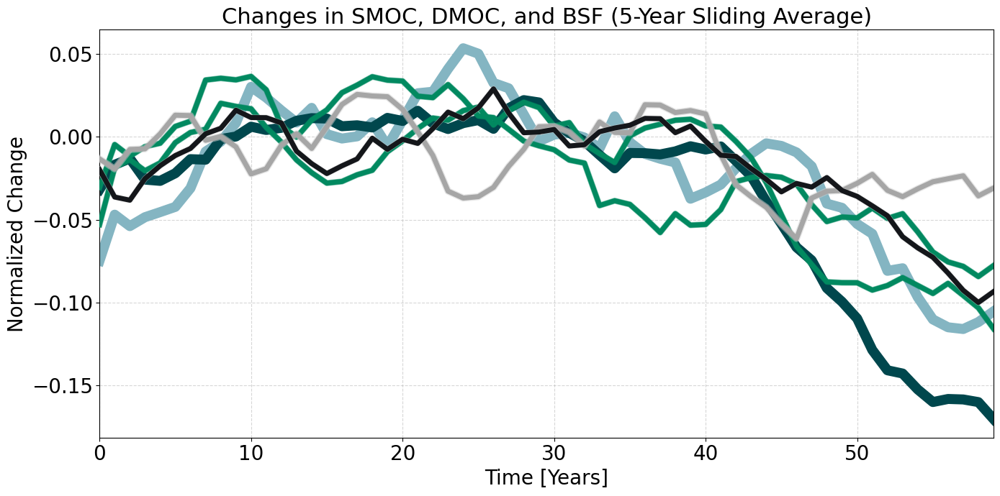

In [24]:
# Set up the plot
plt.figure(figsize=(14, 7))
color_map = cmo.deep
labelsize = 20

# SMOC
plt.plot(delta_smoc_aa_avg.time, delta_smoc_aa_avg, '#84B5C2', linewidth=10, alpha=1)
#plt.scatter(delta_smoc_aa.time, delta_smoc_aa, color='#84B5C2', alpha=1, s=50)
plt.plot(delta_smoc_ghg_avg.time, delta_smoc_ghg_avg, '#00474D', linewidth=10, alpha=1)

# BSF
plt.plot(delta_bsf_aa_avg.time, delta_bsf_aa_avg, '#018960', linewidth=6, alpha=0.5, zorder=2)
#plt.scatter(delta_bsf_aa_avg.time, delta_bsf_aa_avg, color='#FFD9D8', alpha=0.5, s=200, zorder=2)
plt.plot(delta_bsf_aa_avg.time, delta_bsf_aa_avg, '#018960', linewidth=5, zorder=3)
#plt.scatter(delta_bsf_aa_avg.time, delta_bsf_aa_avg, color='#FFC5CC', alpha=1, s=150, zorder=3)

plt.plot(delta_bsf_ghg_avg.time, delta_bsf_ghg_avg, '#018960', linewidth=6, alpha=0.5, zorder=4)
plt.plot(delta_bsf_ghg_avg.time, delta_bsf_ghg_avg, '#018960', linewidth=5, alpha=1, zorder=4)

# DMOC
plt.plot(delta_dmoc_aa_avg.time, delta_dmoc_aa_avg, '#CCCCCC', linewidth=7, alpha=0.5, zorder=5)
#plt.scatter(delta_dmoc_aa_avg.time, delta_dmoc_aa_avg, color='#CCCCCC', alpha=0.5, s=200, zorder=2)
plt.plot(delta_dmoc_aa_avg.time, delta_dmoc_aa_avg, '#A6A6A6', linewidth=5, zorder=5)
#plt.scatter(delta_dmoc_aa_avg.time, delta_dmoc_aa_avg, color='#A6A6A6', alpha=1, s=150, zorder=3)

plt.plot(delta_dmoc_ghg_avg.time, delta_dmoc_ghg_avg, '#CCCCCC', linewidth=6, alpha=0.5, zorder=6)
plt.plot(delta_dmoc_ghg_avg.time, delta_dmoc_ghg_avg, '#14161A', linewidth=5, alpha=1, zorder=6)

# Enhance plot aesthetics
plt.title('Changes in SMOC, DMOC, and BSF (5-Year Sliding Average)', fontsize=labelsize + 2)
plt.xlabel('Time [Years]', fontsize=labelsize)
plt.ylabel('Normalized Change', fontsize=labelsize)
plt.xticks(fontsize=labelsize)
plt.yticks(fontsize=labelsize)

# Set custom x-axis limits and ticks
plt.xlim([delta_smoc_aa.time.min(), delta_smoc_aa.time.max()])
plt.grid(True, linestyle='--', alpha=0.5)  # Light grid for better visibility

# Show the plot
plt.tight_layout()
plt.show()